# Examine catalogs crossmatched with 1182 (indiv exp, dao)

these are also run using updated PSFs and dao

In [1]:
from astropy.table import Table

In [2]:
basepath = '/orange/adamginsburg/jwst/brick'
#tbl = Table.read(f'{basepath}/catalogs/basic_merged-reproject_photometry_tables_merged.fits')

In [3]:
ls -lh {basepath}/catalogs/basic_merged_indivexp_photometry_tables_merged*

-rw-r--r-- 1 adamginsburg adamginsburg 5.3G Aug  2 12:36 /orange/adamginsburg/jwst/brick/catalogs/basic_merged_indivexp_photometry_tables_merged.ecsv
-rw-r--r-- 1 adamginsburg adamginsburg 5.4G Aug  2 08:55 /orange/adamginsburg/jwst/brick/catalogs/basic_merged_indivexp_photometry_tables_merged.fits
-rw-r--r-- 1 adamginsburg adamginsburg 1.1G Aug  2 12:38 /orange/adamginsburg/jwst/brick/catalogs/basic_merged_indivexp_photometry_tables_merged_qualcuts_oksep2221.fits


## Loading Data

In [4]:
%run $basepath/analysis/analysis_setup.py

/blue/adamginsburg/adamginsburg/jwst/brick//reduction/filtering.py:29: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
Set DATE-AVG to '2022-08-28T03:05:32.473' from MJD-AVG.
Set DATE-END to '2022-08-28T03:34:03.557' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.661125 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526408297.850 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2024-07-12 21:04:29
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2024-07-10 08:27:09


In [5]:
%run $basepath/analysis/selections.py --module=merged1182_daophot_basic_indivexp

Set DATE-AVG to '2022-08-28T03:05:32.473' from MJD-AVG.
Set DATE-END to '2022-08-28T03:34:03.557' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.661125 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526408297.850 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2024-07-12 21:04:29
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2024-07-10 08:27:09
Selecting module merged1182_daophot_basic_indivexp

merged1182_daophot_basic_indivexp
Selecting based on filters ['f410m', 'f212n', 'f466n', 'f405n', 'f187n', 'f182m', 'f444w', 'f356w', 'f200w', 'f115w']
2032 saturated in near_saturated_f212n_f212n
116 saturated in near_saturated_f466n_f466n
1562 saturated in near_saturated_f405n_f405n
943 saturated in near_saturated_f187n_f187n
17207 saturated in near_saturated_f182m_f182m
32471 saturated in near_saturated_f444w_f444w
40458 saturated in near_saturated_f356w_f356w
55206 saturated in near_saturated_f200w_f200w
2501 saturated in near_saturated_f115w_f115w
117639 near saturated out of 2922158.  That leaves 2804519 not near unsaturated
2032 saturated in near_saturated_f212n_f212n
116 saturated in

### nmatch

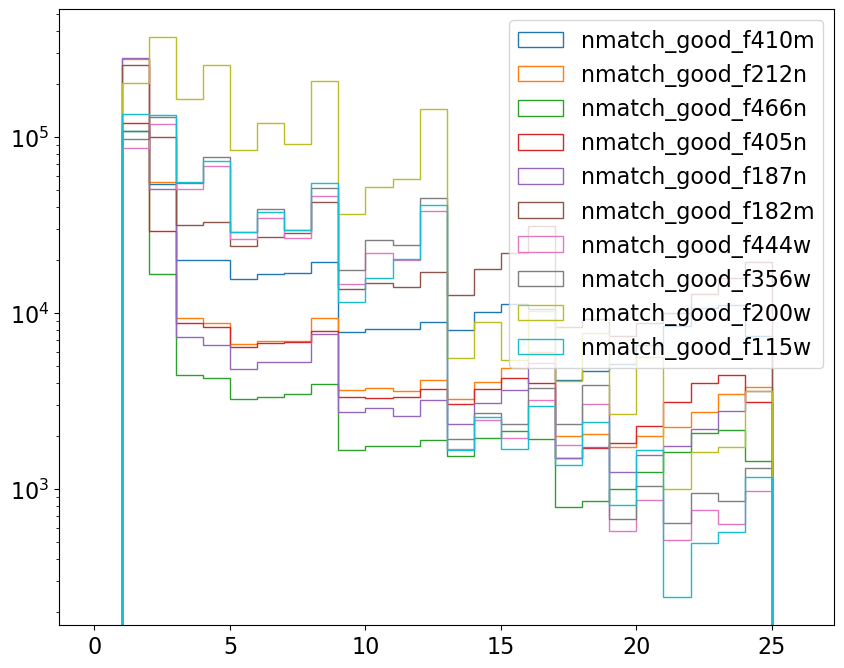

In [6]:
for cn in basetable.colnames:
    if 'nmatch_good' in cn:
        pl.hist(basetable[cn], bins=np.linspace(0,26,27), label=cn, histtype='step')
pl.legend(loc='best');
pl.yscale('log');

# Xmatch

Set DATE-AVG to '2022-08-28T00:59:05.370' from MJD-AVG.
Set DATE-END to '2022-08-28T01:27:10.957' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.725189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1527161940.784 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


For filter f410m, found 59156 out of 59156 data points
med sep: 0.0024623181919061193 arcsec, std(sep): 0.0064421022751604655 arcsec
For filter f212n, found 40266 out of 40266 data points
med sep: 0.004644954167515605 arcsec, std(sep): 0.013351574210386056 arcsec
For filter f466n, found 37023 out of 37023 data points
med sep: 0.004143634291390691 arcsec, std(sep): 0.011776788177818838 arcsec
For filter f187n, found 36270 out of 36270 data points
med sep: 0.004623872151581531 arcsec, std(sep): 0.014806334186352233 arcsec
For filter f182m, found 43671 out of 43671 data points
med sep: 0.005185537211578248 arcsec, std(sep): 0.013096287446780229 arcsec


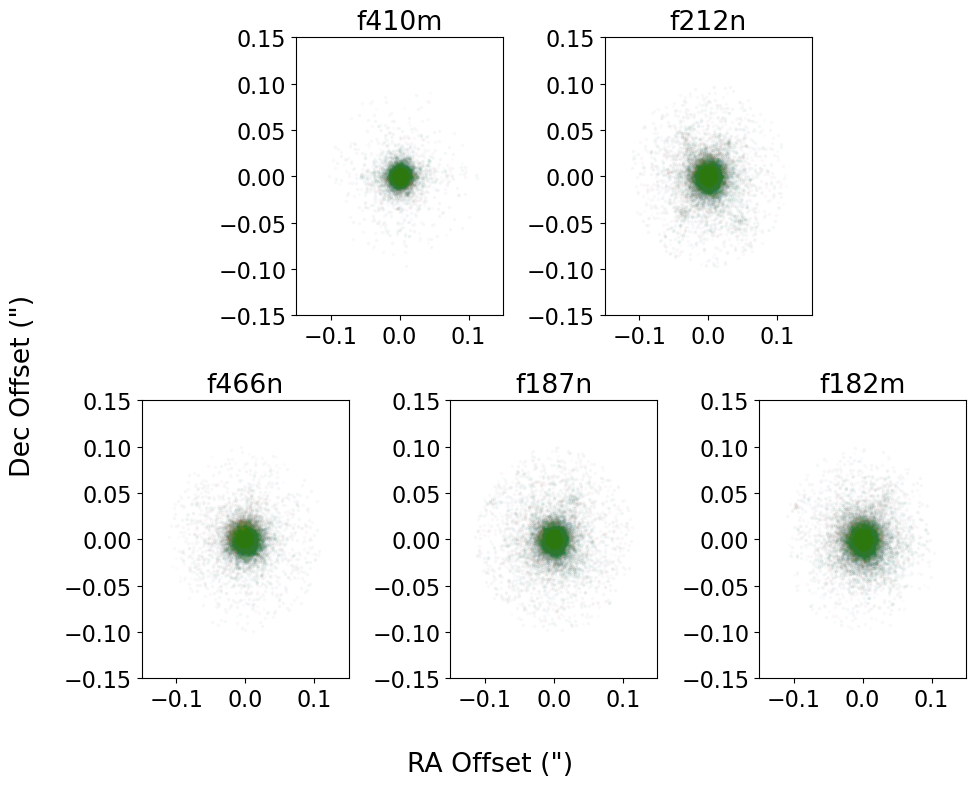

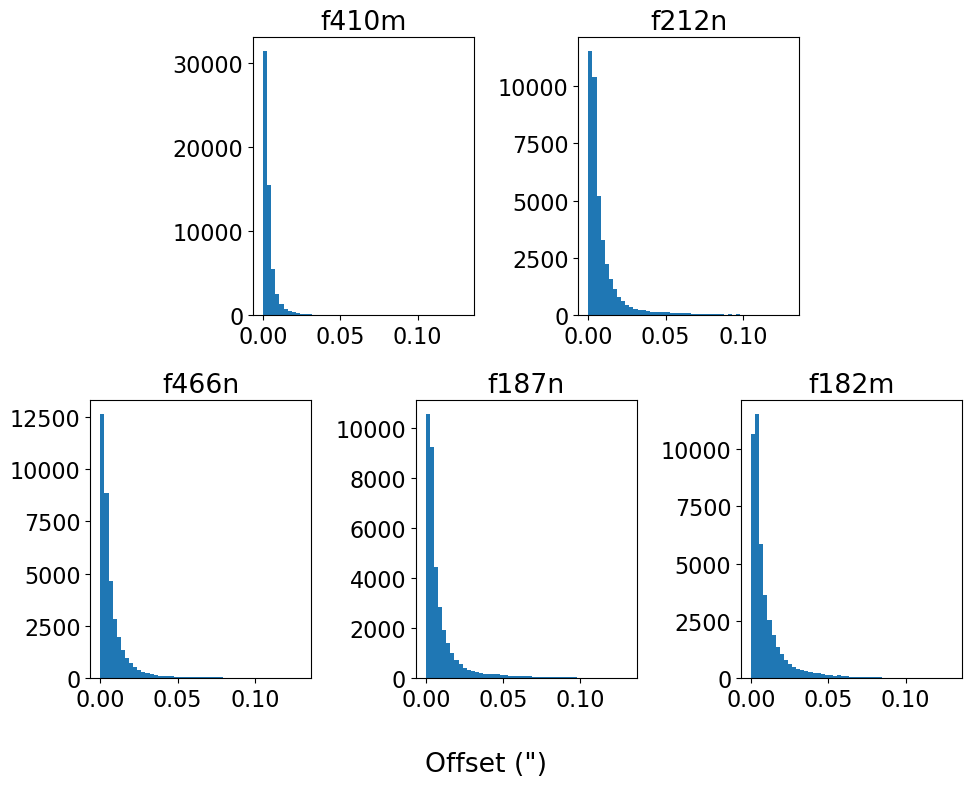

<Figure size 1000x800 with 0 Axes>

In [7]:
sel = ((basetable['nmatch_good_f410m'] >= 5) |
       (basetable['nmatch_good_f466n'] >= 5) |
       (basetable['nmatch_good_f444w'] >= 5) |
       (basetable['nmatch_good_f356w'] >= 5)
      ) & (basetable['qfit_f405n'] < 0.40) & (basetable['qfit_f410m'] < 0.40)
plot_tools.xmatch_plot(basetable, sel=sel, axlims=[-0.15, 0.15, -0.15, 0.15]);

Set DATE-AVG to '2022-08-28T00:59:05.370' from MJD-AVG.
Set DATE-END to '2022-08-28T01:27:10.957' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.725189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1527161940.784 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


For filter f410m, found 59156 out of 59156 data points
med sep: 0.0024623181919061193 arcsec, std(sep): 0.0064421022751604655 arcsec
For filter f212n, found 40266 out of 40266 data points
med sep: 0.004644954167515605 arcsec, std(sep): 0.013351574210386056 arcsec
For filter f466n, found 37023 out of 37023 data points
med sep: 0.004143634291390691 arcsec, std(sep): 0.011776788177818838 arcsec
For filter f187n, found 36270 out of 36270 data points
med sep: 0.004623872151581531 arcsec, std(sep): 0.014806334186352233 arcsec
For filter f182m, found 43671 out of 43671 data points
med sep: 0.005185537211578248 arcsec, std(sep): 0.013096287446780229 arcsec
For filter f444w, found 39813 out of 39813 data points
med sep: 0.005521709049098131 arcsec, std(sep): 0.010781964444320974 arcsec
For filter f356w, found 36488 out of 36488 data points
med sep: 0.00604580298219856 arcsec, std(sep): 0.010623067933052762 arcsec
For filter f200w, found 35018 out of 35018 data points
med sep: 0.0072040132372136

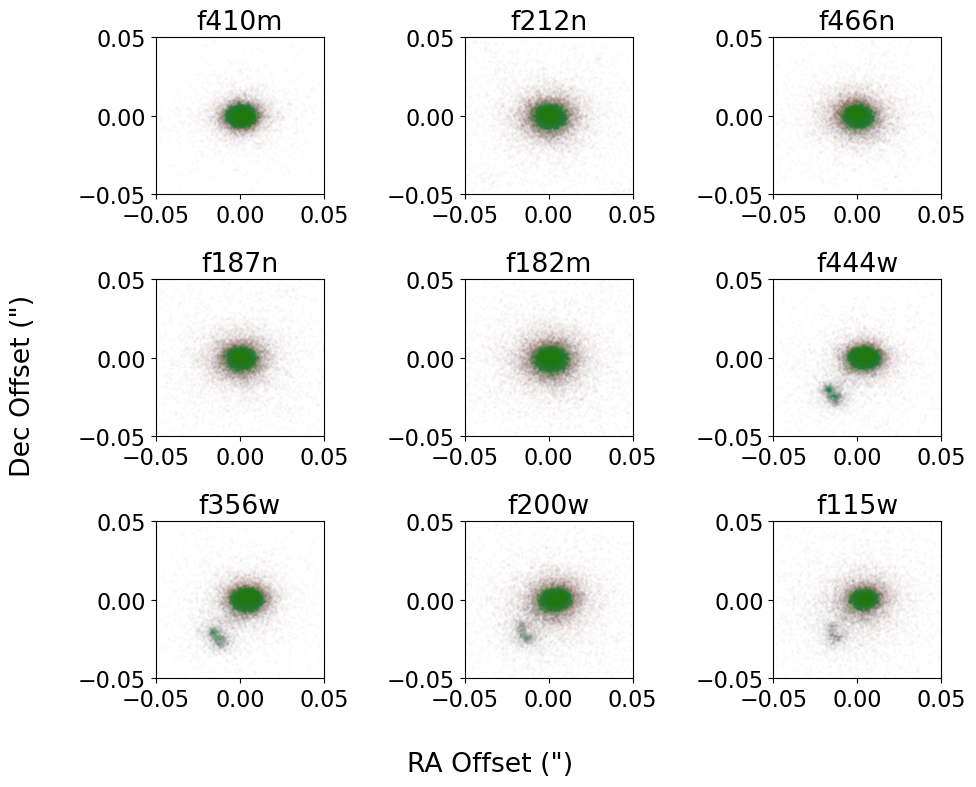

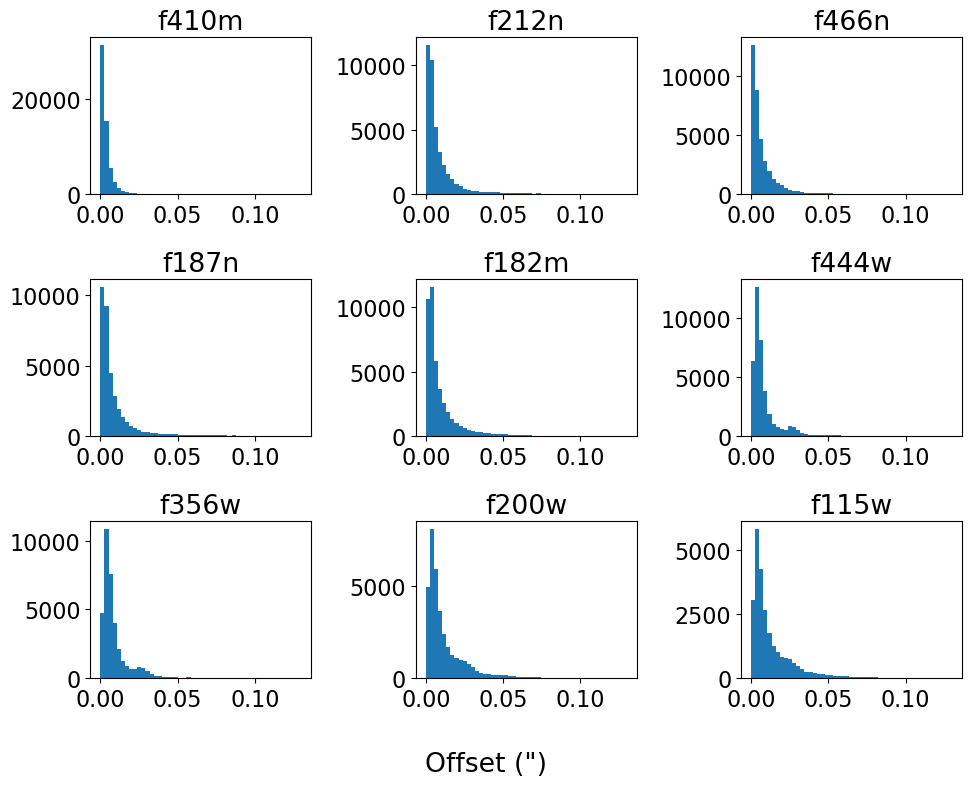

<Figure size 1000x800 with 0 Axes>

In [8]:
all_filternames = ['f410m', 'f212n', 'f466n', 'f405n', 'f187n', 'f182m', 'f444w', 'f356w', 'f200w', 'f115w']
plot_tools.xmatch_plot(basetable, sel=sel, filternames=all_filternames, alpha=0.005,
                       #axlims=[-0.1, 0.1, -0.1, 0.1]);
                       axlims=[-0.05, 0.05, -0.05, 0.05]);

<>:18: SyntaxWarning: invalid escape sequence '\D'
<>:19: SyntaxWarning: invalid escape sequence '\D'
<>:18: SyntaxWarning: invalid escape sequence '\D'
<>:19: SyntaxWarning: invalid escape sequence '\D'
/scratch/local/39765574/ipykernel_3035208/4242995815.py:18: SyntaxWarning: invalid escape sequence '\D'
  pl.xlabel('$\Delta$RA')
/scratch/local/39765574/ipykernel_3035208/4242995815.py:19: SyntaxWarning: invalid escape sequence '\D'
  pl.ylabel('$\Delta$Dec');


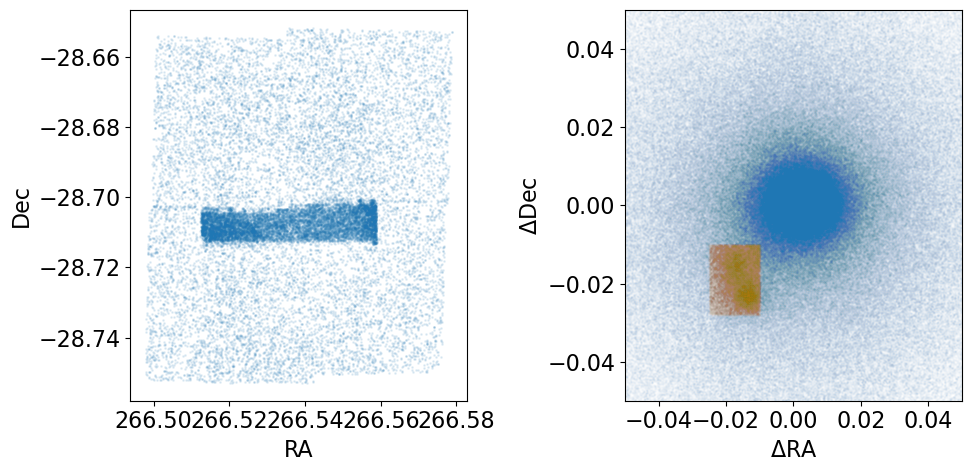

In [9]:
filtername = 'f200w'
thissel = ~basetable[f'flux_{filtername}'].mask

basecrds = basetable['skycoord_ref']
crds = basetable[f'skycoord_{filtername}'][thissel]
radiff = (crds.ra-basecrds.ra[thissel]).to(u.arcsec)
decdiff = (crds.dec-basecrds.dec[thissel]).to(u.arcsec)
sel_ = (radiff < -0.01*u.arcsec) & (decdiff < -0.01*u.arcsec) & (radiff > -0.025*u.arcsec) & (decdiff > -0.028*u.arcsec)
pl.figure(figsize=(10, 5));
pl.subplot(1,2,1)
pl.scatter(basetable['skycoord_f200w'].ra[thissel][sel_], basetable['skycoord_f200w'].dec[thissel][sel_], s=1, alpha=0.1);
pl.xlabel('RA')
pl.ylabel('Dec')
pl.subplot(1,2,2)
pl.scatter(radiff, decdiff, s=1, alpha=0.01)
pl.scatter(radiff[sel_], decdiff[sel_], s=1, alpha=0.01);
pl.axis([-0.05, 0.05, -0.05, 0.05]);
pl.xlabel('$\Delta$RA')
pl.ylabel('$\Delta$Dec');
pl.tight_layout();

## After loading data

In [10]:
{filtername: (basetable[f'sep_{filtername}'] < 0.1*u.arcsec).sum() for filtername in filternames}

{'f410m': 617082,
 'f212n': 626317,
 'f466n': 288506,
 'f405n': 395148,
 'f187n': 602204,
 'f182m': 1068728,
 'f444w': 917217,
 'f356w': 1031961,
 'f200w': 2243158,
 'f115w': 969864}

In [11]:
np.logical_and.reduce([basetable[f'sep_{filtername}'] < 0.1*u.arcsec for filtername in filternames if 'w' not in filtername]).sum()

112224

In [12]:
np.logical_and.reduce([basetable[f'sep_{filtername}'] < 0.1*u.arcsec for filtername in filternames]).sum()

86409

In [13]:
sel = any_good
sel.sum(), len(basetable)

(1322278, 2922158)

In [14]:
%matplotlib inline
import pylab as pl

In [15]:
import sys
sys.path.append(f'{basepath}/analysis')
sys.path.append(f'{basepath}/reduction')
import plot_tools
import importlib as imp
imp.reload(plot_tools)

<module 'plot_tools' from '/blue/adamginsburg/adamginsburg/jwst/brick//analysis/plot_tools.py'>

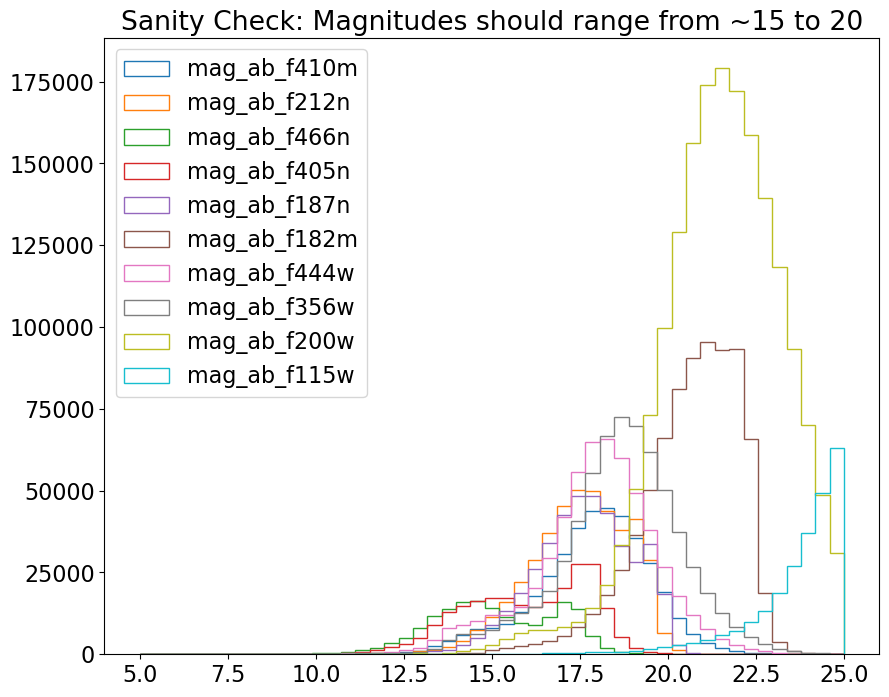

In [16]:
for cn in basetable.colnames:
    if cn.startswith('mag_ab_f'):
        pl.hist(basetable[cn], bins=np.linspace(5,25), label=cn, histtype='step')
pl.title("Sanity Check: Magnitudes should range from ~15 to 20");
pl.legend(loc='upper left');

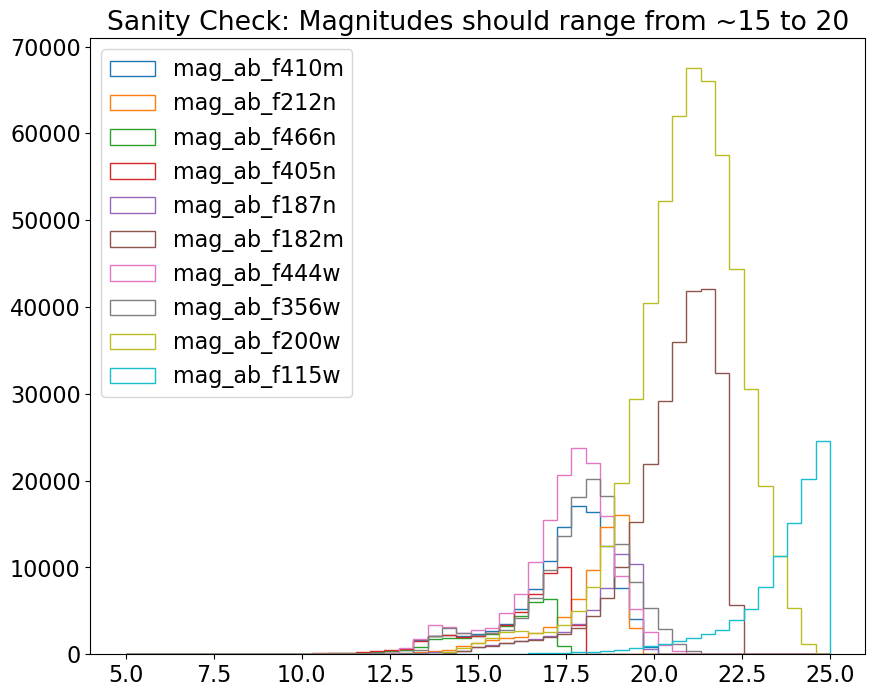

In [17]:
for cn in basetable.colnames:
    if cn.startswith('mag_ab_f'):
        pl.hist(basetable[cn][(basetable['qfit_'+cn[7:]] < 0.4) &
                              (basetable['nmatch_good_'+cn[7:]] > 4) &
                              (basetable['sep_'+cn[7:]] < 0.05) ], bins=np.linspace(5,25), label=cn, histtype='step')
pl.title("Sanity Check: Magnitudes should range from ~15 to 20");
pl.legend(loc='upper left');

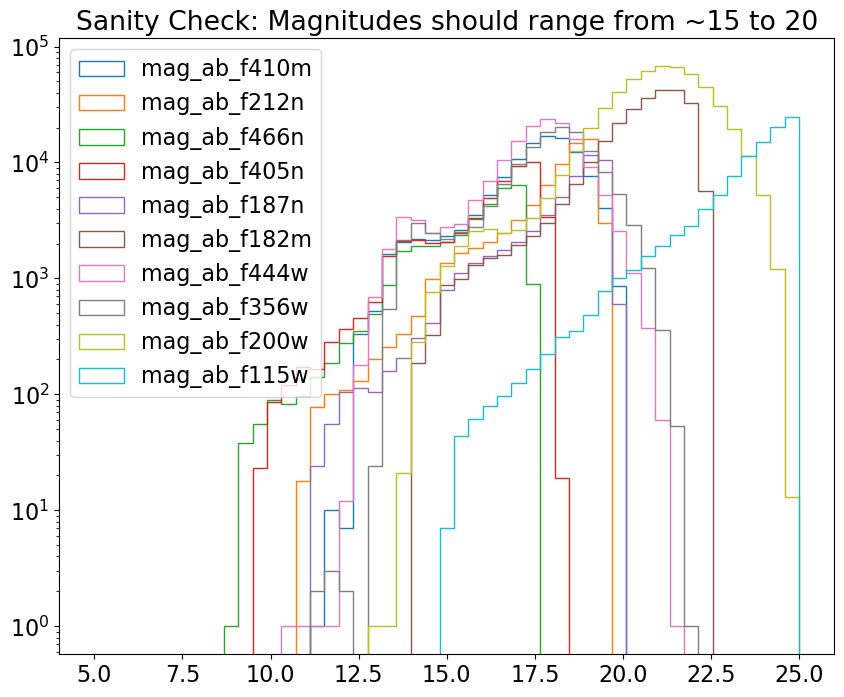

In [18]:
for cn in basetable.colnames:
    if cn.startswith('mag_ab_f'):
        pl.hist(basetable[cn][(basetable['qfit_'+cn[7:]] < 0.4) &
                              (basetable['nmatch_good_'+cn[7:]] > 4) &
                              (basetable['sep_'+cn[7:]] < 0.05) ], bins=np.linspace(5,25), label=cn, histtype='step')
pl.title("Sanity Check: Magnitudes should range from ~15 to 20");
pl.legend(loc='upper left');
pl.yscale('log');

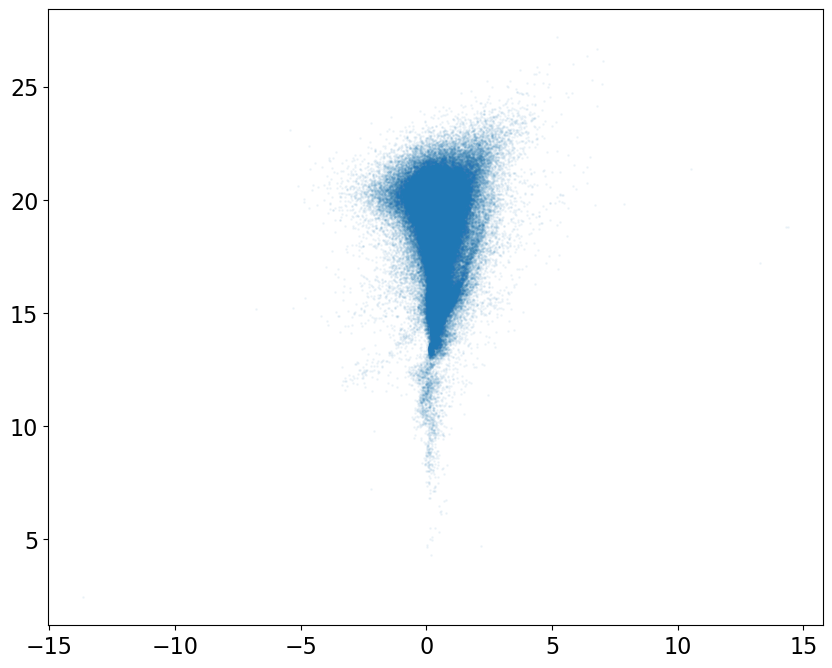

In [19]:
pl.scatter(basetable['mag_ab_f356w'] - basetable['mag_ab_f444w'], basetable['mag_ab_f356w'], alpha=0.05, s=1);

In [20]:
oksep_notwide.sum(), (~oksep_notwide).sum()

(112224, 2809934)

In [21]:
oksep_noJ.sum(), (~oksep_noJ).sum()

(95380, 2826778)

In [22]:
oksep.sum(), (~oksep).sum()

(86409, 2835749)

In [23]:
print(f"Excluding {exclude.sum()} of {exclude.size} ({exclude.sum()/exclude.size*100}%)")

Excluding 2790805 of 2922158 (95.50493162929588%)


In [24]:
badqflong.sum(), goodqflong.sum(), len(goodqflong), badspreadlong.sum()

(2889561, 32597, 2922158, 2871464)

In [25]:
exclude.sum(), exclude.size, any_saturated.sum(), (~oksep).sum(), oksep.sum(), magerr_gtpt1_all.sum(), (badqflong | badfracfluxlong | badspreadlong).sum()

(2790805, 2922158, 117781, 2835749, 86409, 14, 2889561)

In [26]:
[(basetable[f'sep_{filtername}'] < 0.1*u.arcsec).sum() for filtername in filternames[1:]]

[626317, 288506, 395148, 602204, 1068728, 917217, 1031961, 2243158, 969864]

In [27]:
exclude = (any_saturated  | magerr_gtpt1_all )
exclude.sum(), exclude.size

(117789, 2922158)

/orange/adamginsburg/miniconda3/envs/python312/lib/python3.12/site-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedColumn.
  arr.partition(


output array is read-only
output array is read-only


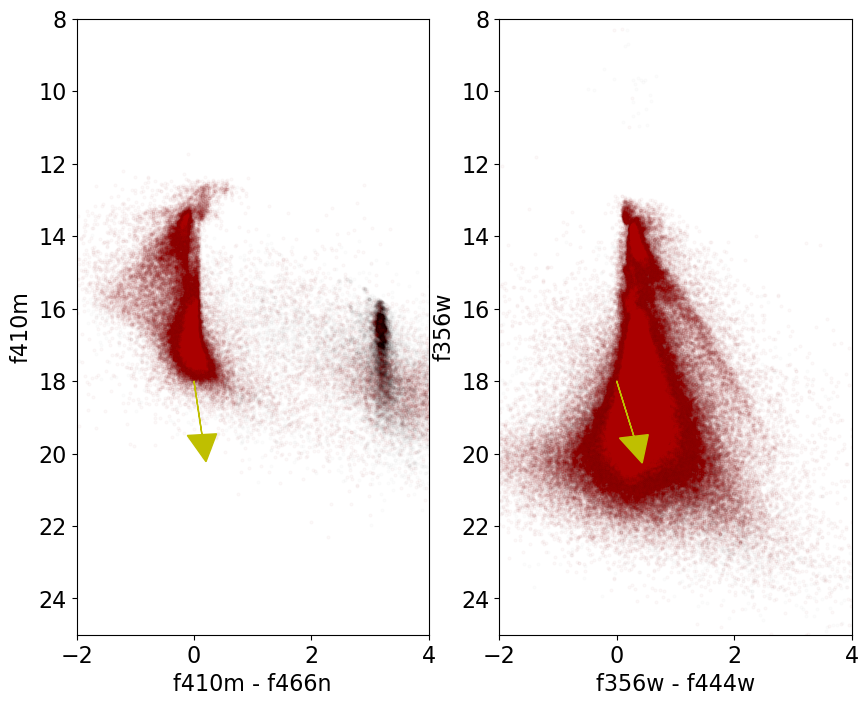

<Figure size 1000x800 with 0 Axes>

In [28]:
plot_tools.cmds(basetable, colors=[('f410m', 'f466n'), ('f356w', 'f444w')],
                sel=sel, axlims=[-2,4,25,8], xlim_percentiles=(5,95), alpha=0.01,
                alpha_sel=0.01,
                exclude=exclude);

output array is read-only
output array is read-only


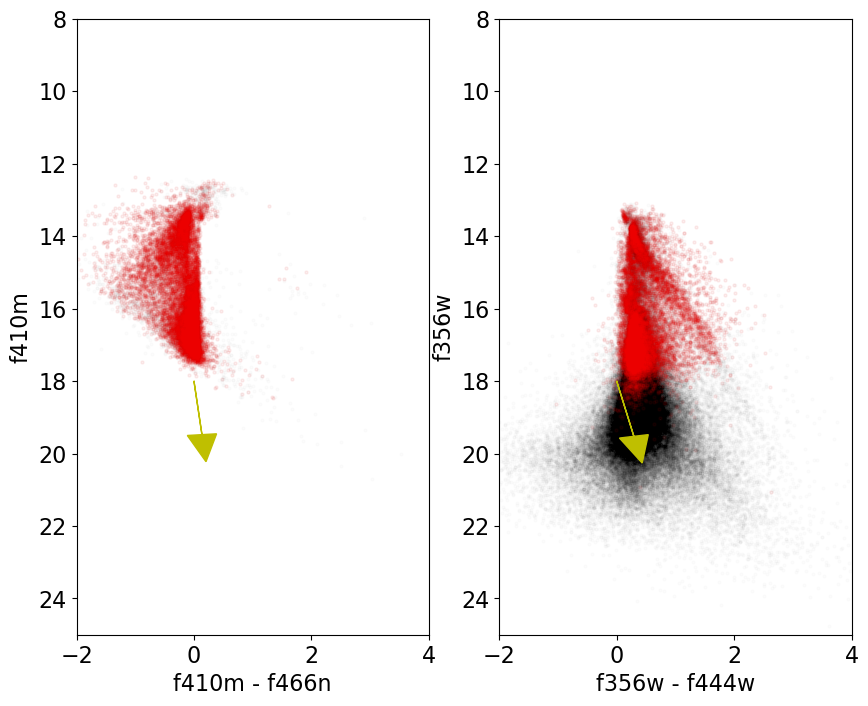

<Figure size 1000x800 with 0 Axes>

In [29]:
plot_tools.cmds(basetable, colors=[('f410m', 'f466n'), ('f356w', 'f444w')],
                sel=oksep_noJ, alpha_sel=0.05,
                axlims=[-2,4,25,8], xlim_percentiles=(5,95), alpha=0.01,
                exclude=((basetable['nmatch_good_f410m'] < 5) |
                         (basetable['nmatch_good_f466n'] < 5) |
                         (basetable['nmatch_good_f444w'] < 5) |
                         (basetable['nmatch_good_f356w'] < 5)),
               );

output array is read-only
output array is read-only


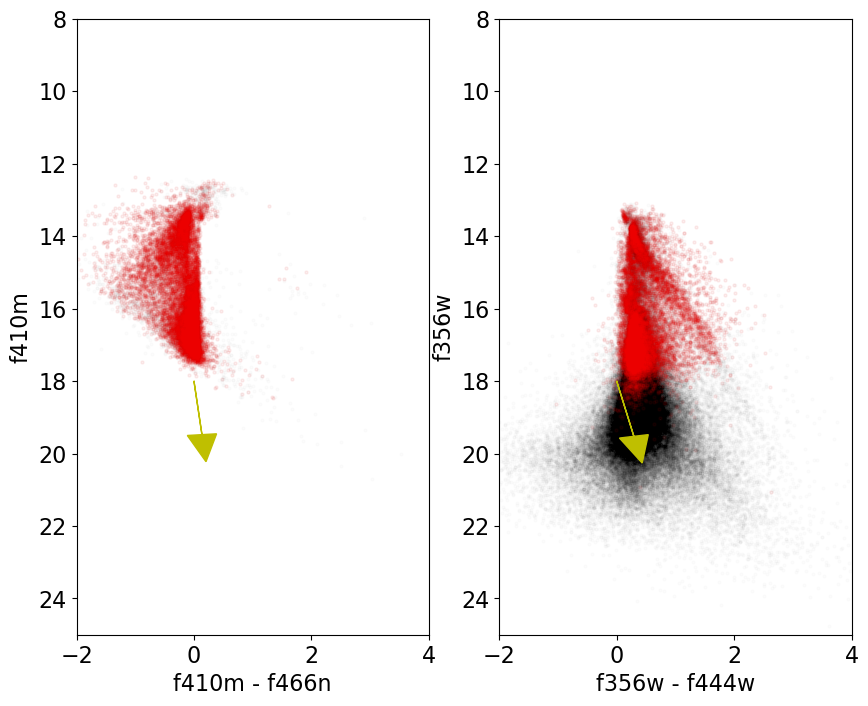

<Figure size 1000x800 with 0 Axes>

In [30]:
plot_tools.cmds(basetable, colors=[('f410m', 'f466n'), ('f356w', 'f444w')],
                sel=oksep_noJ, alpha_sel=0.05,
                axlims=[-2,4,25,8], xlim_percentiles=(5,95), alpha=0.01,
                exclude=((basetable['nmatch_good_f410m'] < 5) |
                         (basetable['nmatch_good_f466n'] < 5) |
                         (basetable['nmatch_good_f444w'] < 5) |
                         (basetable['nmatch_good_f356w'] < 5) |
                         (basetable['sep_f356w'] > 0.05) |
                         (basetable['sep_f444w'] > 0.05) |
                         (basetable['sep_f410m'] > 0.05) |
                         (basetable['sep_f466n'] > 0.05)
                        ),
               );

# Another hunt for accreting sources

There is clear structure in the CMDs.

However, the "excess" sources in both F187 and F405 seem to trace the outskirts and are mildly correlated with higher extinction.  Neither of these points to likely real accreters.

(-0.25, 0.5)

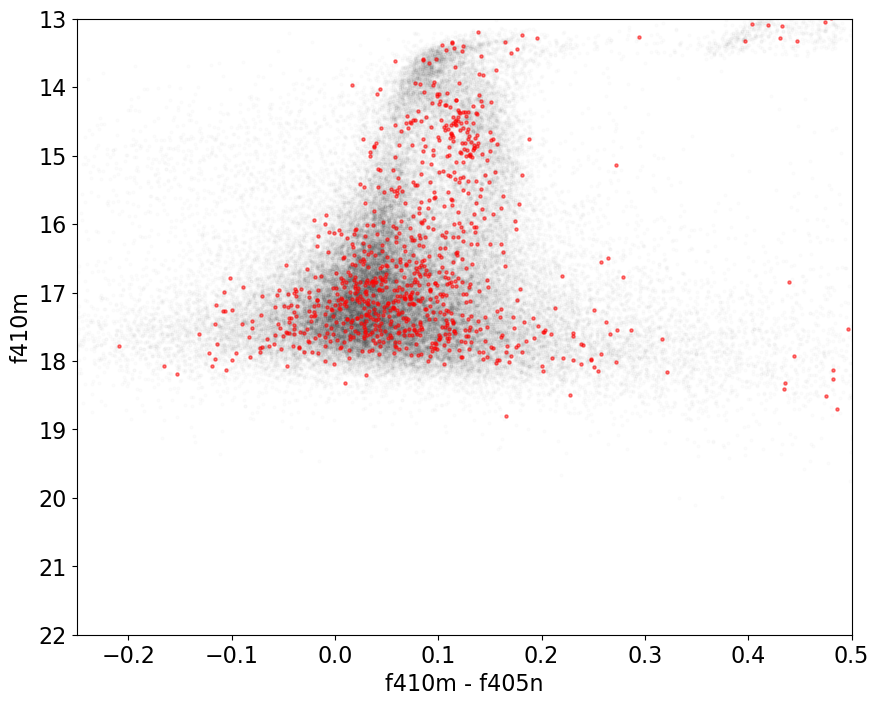

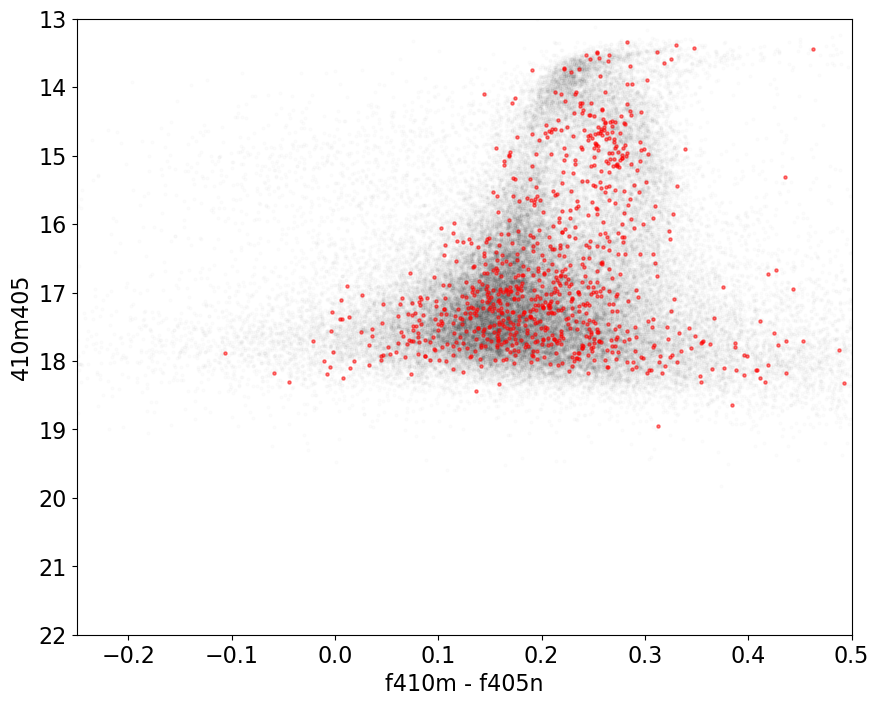

In [31]:
basesel = (basetable['nmatch_good_f405n'] >= 5) & (basetable['nmatch_good_f410m'] >= 5)
sel = basesel & (basetable['sep_f405n'].quantity < 0.1*u.arcsec)
sel &= reg.contains(basetable['skycoord_f410m'], ww)
pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[basesel], basetable['mag_ab_f410m'][basesel], s=5, alpha=0.01, c='k')
pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[sel], basetable['mag_ab_f410m'][sel], s=5, alpha=0.5, c='r')
pl.ylim(pl.ylim()[::-1])
pl.xlabel("f410m - f405n")
pl.ylabel("f410m")
pl.ylim(22,13)
pl.xlim(-0.25,0.5)

pl.figure()
pl.scatter((basetable['mag_ab_410m405'] - basetable['mag_ab_f405n'])[basesel], basetable['mag_ab_410m405'][basesel], s=5, alpha=0.01, c='k')
pl.scatter((basetable['mag_ab_410m405'] - basetable['mag_ab_f405n'])[sel], basetable['mag_ab_410m405'][sel], s=5, alpha=0.5, c='r')
pl.ylim(pl.ylim()[::-1])
pl.xlabel("f410m - f405n")
pl.ylabel("410m405")
pl.ylim(22,13)
pl.xlim(-0.25,0.5)

/orange/adamginsburg/miniconda3/envs/python312/lib/python3.12/site-packages/matplotlib/cbook.py:1699: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)


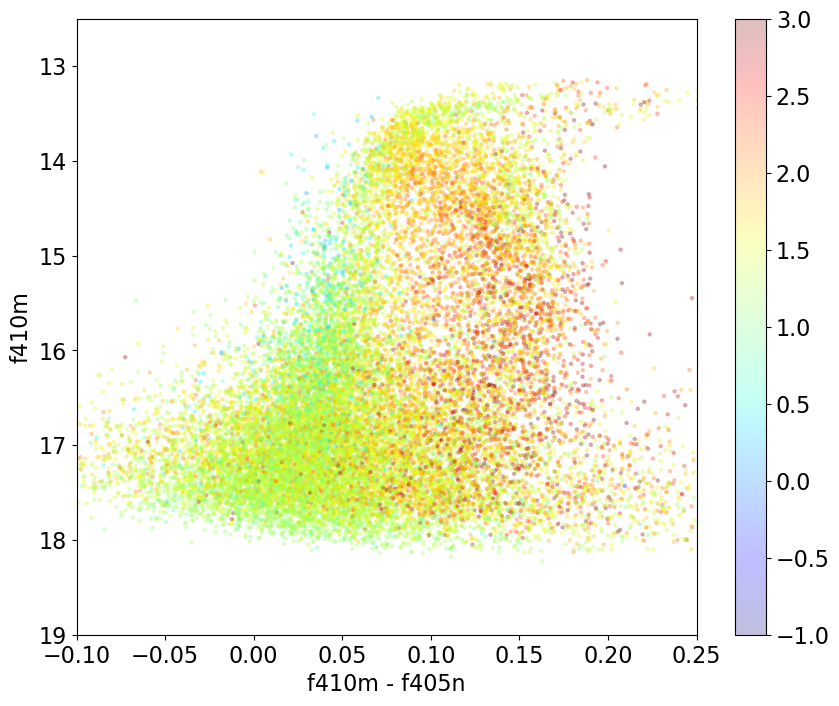

In [32]:
basesel = (basetable['nmatch_good_f405n'] >= 5) & (basetable['nmatch_good_f410m'] >= 5)
basesel &= (basetable['emag_ab_f410m'] < 0.1) & (basetable['emag_ab_f405n'] < 0.1)
sel = basesel & (basetable['sep_f405n'].quantity < 0.1*u.arcsec)
sel &= reg.contains(basetable['skycoord_f410m'], ww)
pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[basesel], basetable['mag_ab_f410m'][basesel],
           s=5, alpha=0.25, c=(basetable['mag_ab_f200w'] - basetable['mag_ab_f356w'])[basesel],
           vmin=-1, vmax=3, cmap='jet'
          )
#pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[sel],
#           basetable['mag_ab_f410m'][sel], s=5, alpha=0.5, c='r')
pl.ylim(pl.ylim()[::-1])
pl.xlabel("f410m - f405n")
pl.ylabel("f410m")
pl.ylim(19,12.5)
pl.xlim(-0.1,0.25);
pl.colorbar();

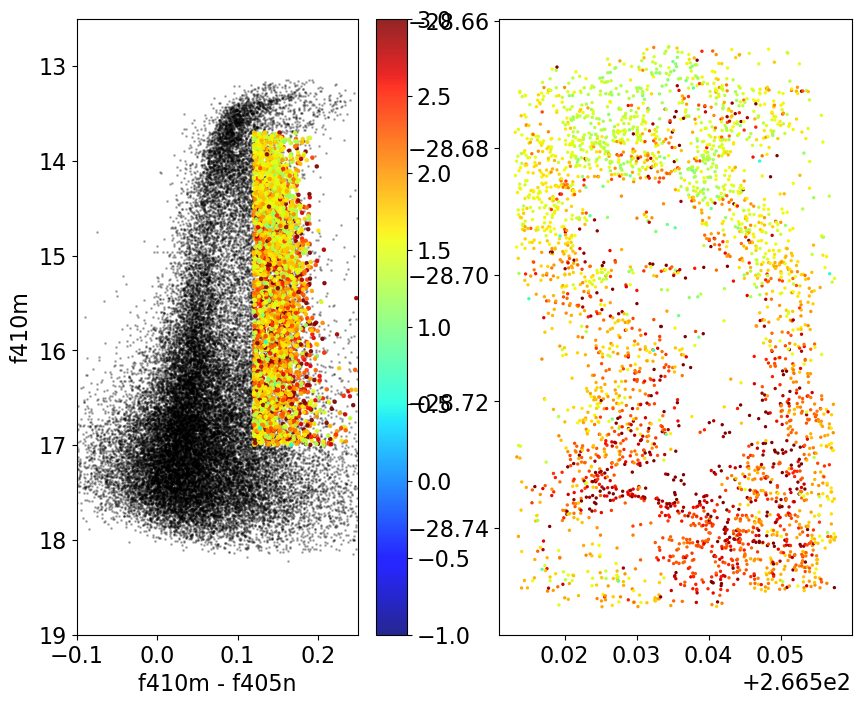

In [69]:
basesel = (basetable['nmatch_good_f405n'] >= 5) & (basetable['nmatch_good_f410m'] >= 5)
basesel &= (basetable['emag_ab_f410m'] < 0.1) & (basetable['emag_ab_f405n'] < 0.1)

sel = basesel & ((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']) > 0.12)
sel &= basetable['mag_ab_f410m'] < 17
sel &= basetable['mag_ab_f410m'] > 13.7

pl.subplot(1, 2, 1)
pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[basesel], basetable['mag_ab_f410m'][basesel],
           s=1, alpha=0.25, c='k'
          )
pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[sel], basetable['mag_ab_f410m'][sel],
           s=5, alpha=0.85, c=(basetable['mag_ab_f200w'] - basetable['mag_ab_f356w'])[sel],
           vmin=-1, vmax=3, cmap='jet'
          )
#pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[sel],
#           basetable['mag_ab_f410m'][sel], s=5, alpha=0.5, c='r')
pl.ylim(pl.ylim()[::-1])
pl.xlabel("f410m - f405n")
pl.ylabel("f410m")
pl.ylim(19,12.5)
pl.xlim(-0.1,0.25);
pl.colorbar();

pl.subplot(1, 2, 2)
pl.scatter(basetable['skycoord_ref'].ra[sel],
           basetable['skycoord_ref'].dec[sel],
           c=(basetable['mag_ab_f200w'] - basetable['mag_ab_f356w'])[sel],
           s=2, cmap='jet', vmin=-1, vmax=3
          )

/orange/adamginsburg/miniconda3/envs/python312/lib/python3.12/site-packages/matplotlib/cbook.py:1699: UserWarning: Warning: converting a masked element to nan.
  return math.isfinite(val)


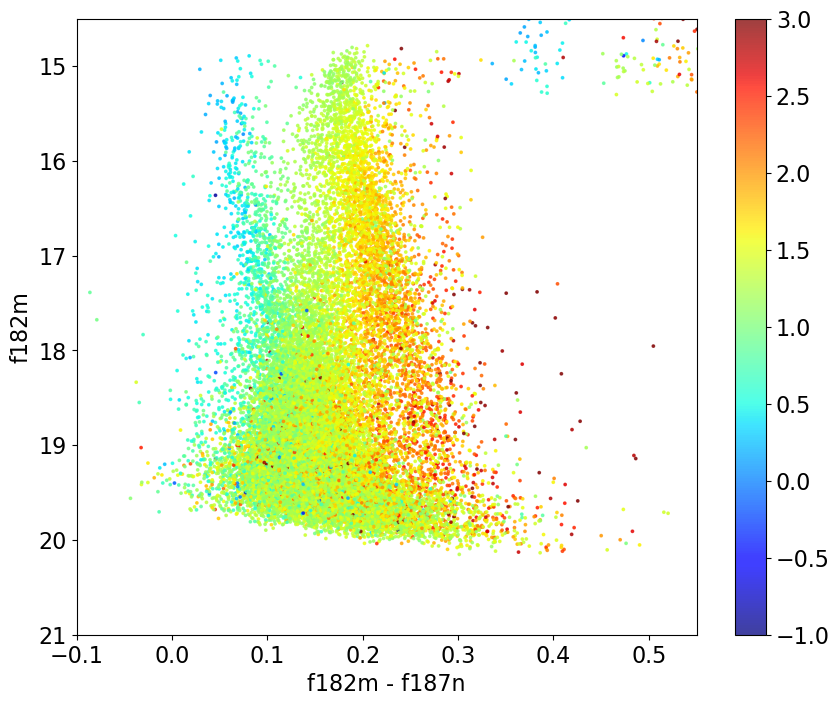

In [68]:
basesel = (basetable['nmatch_good_f187n'] >= 5) & (basetable['nmatch_good_f182m'] >= 5)
basesel &= basetable['emag_ab_f182m'] < 0.1
basesel &= basetable['emag_ab_f187n'] < 0.1

sel = basesel & (basetable['sep_f187n'].quantity < 0.1*u.arcsec)
sel &= reg.contains(basetable['skycoord_f182m'], ww)
sel &= (basetable['mag_ab_f182m'] - basetable['mag_ab_f187n']) > 0.2
sel &= basetable['mag_ab_f182m'] < 19
sel &= basetable['mag_ab_f182m'] > 15.2

pl.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f187n'])[basesel], basetable['mag_ab_f182m'][basesel],
           s=3, alpha=0.75, c=(basetable['mag_ab_f200w'] - basetable['mag_ab_f356w'])[basesel],
           vmin=-1, vmax=3, cmap='jet'
          );
pl.ylim(pl.ylim()[::-1])
pl.xlabel("f182m - f187n")
pl.ylabel("f182m")
pl.ylim(21,14.5)
pl.xlim(-0.1,0.55);
pl.colorbar();

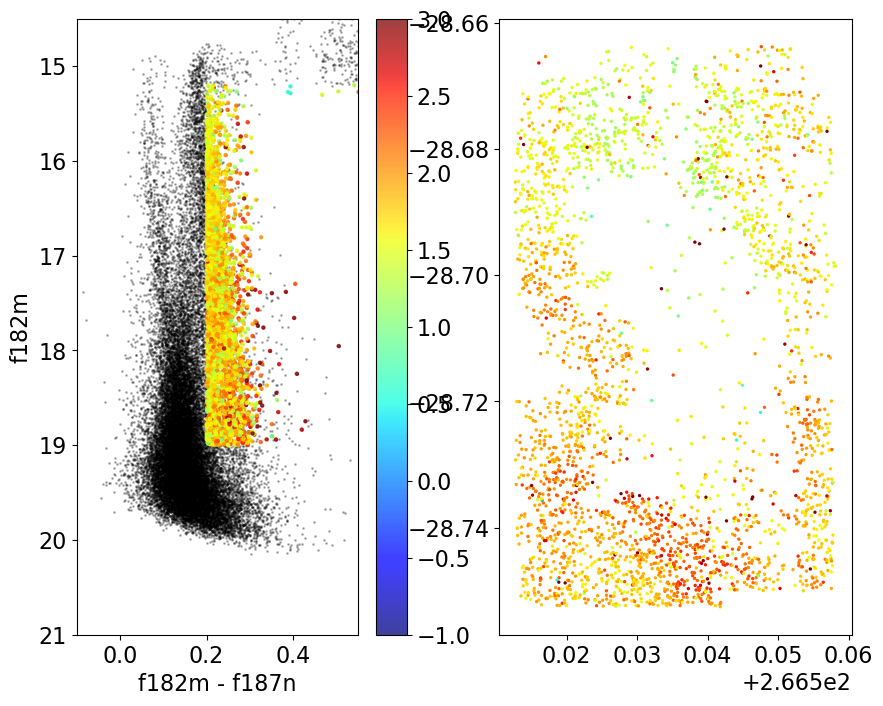

In [67]:
basesel = ((basetable['nmatch_good_f187n'] >= 5) &
           (basetable['nmatch_good_f182m'] >= 5) &
           (basetable['sep_f187n'].quantity < 0.1*u.arcsec) &
           np.isfinite((basetable['mag_ab_f200w'] - basetable['mag_ab_f356w']))
          )
basesel &= basetable['emag_ab_f182m'] < 0.1
basesel &= basetable['emag_ab_f187n'] < 0.1

sel = basesel.copy()
sel &= (basetable['mag_ab_f182m'] - basetable['mag_ab_f187n']) > 0.2
sel &= basetable['mag_ab_f182m'] < 19
sel &= basetable['mag_ab_f182m'] > 15.2

pl.subplot(1, 2, 1)
pl.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f187n'])[basesel], basetable['mag_ab_f182m'][basesel],
           s=1, alpha=0.25, c='k',
          )
pl.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f187n'])[sel], basetable['mag_ab_f182m'][sel],
           s=5, alpha=0.75, c=(basetable['mag_ab_f200w'] - basetable['mag_ab_f356w'])[sel],
           vmin=-1, vmax=3, cmap='jet'
          )
#pl.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f187n'])[sel],
#           basetable['mag_ab_f182m'][sel], s=5, alpha=0.5, c='r')
pl.ylim(pl.ylim()[::-1])
pl.xlabel("f182m - f187n")
pl.ylabel("f182m")
pl.ylim(21,14.5)
pl.xlim(-0.1,0.55);
pl.colorbar();

pl.subplot(1, 2, 2)
pl.scatter(basetable['skycoord_ref'].ra[sel],
           basetable['skycoord_ref'].dec[sel],
           c=(basetable['mag_ab_f200w'] - basetable['mag_ab_f356w'])[sel],
           s=2, cmap='jet', vmin=-1, vmax=3
          )

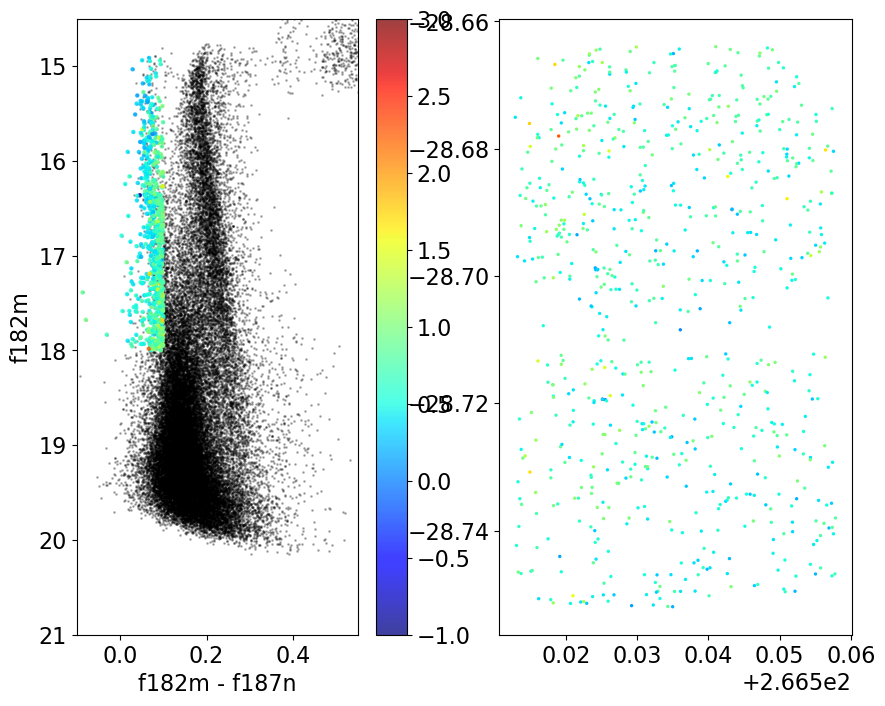

In [66]:
basesel = (basetable['nmatch_good_f187n'] >= 5) & (basetable['nmatch_good_f182m'] >= 5)
basesel &= basetable['emag_ab_f182m'] < 0.1
basesel &= basetable['emag_ab_f187n'] < 0.1

sel = basesel & (basetable['sep_f187n'].quantity < 0.1*u.arcsec)
sel &= (basetable['mag_ab_f182m'] - basetable['mag_ab_f187n']) < 0.1
sel &= basetable['mag_ab_f182m'] < 18
sel &= basetable['mag_ab_f182m'] > 14.9

pl.subplot(1, 2, 1)
pl.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f187n'])[basesel], basetable['mag_ab_f182m'][basesel],
           s=1, alpha=0.25, c='k',
          )
pl.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f187n'])[sel], basetable['mag_ab_f182m'][sel],
           s=5, alpha=0.75, c=(basetable['mag_ab_f200w'] - basetable['mag_ab_f356w'])[sel],
           vmin=-1, vmax=3, cmap='jet'
          )
#pl.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f187n'])[sel],
#           basetable['mag_ab_f182m'][sel], s=5, alpha=0.5, c='r')
pl.ylim(pl.ylim()[::-1])
pl.xlabel("f182m - f187n")
pl.ylabel("f182m")
pl.ylim(21,14.5)
pl.xlim(-0.1,0.55);
pl.colorbar();

pl.subplot(1, 2, 2)
pl.scatter(basetable['skycoord_ref'].ra[sel],
           basetable['skycoord_ref'].dec[sel],
           c=(basetable['mag_ab_f200w'] - basetable['mag_ab_f356w'])[sel],
           s=2, cmap='jet', vmin=-1, vmax=3
          )

In [36]:
avm_short_merged = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_212-187-182_RGB_unrotated.png')
img_short_merged = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_212-187-182_RGB_unrotated.png'))[::-1,:,:]
wwi_short_merged = wcs.WCS(fits.Header.fromstring(avm_short_merged.Spatial.FITSheader))

wwi = wwi_short_merged
img = img_short_merged

In [37]:
wwi_short_merged

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN' 'DEC--TAN' 
CRVAL : 266.5355026705 -28.713135673174 
CRPIX : 2484.6907322601 5878.3480524462 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : -8.5391104898054e-06 8.5391104898054e-06 
NAXIS : 4945  11772

35118 395148 22380 1001


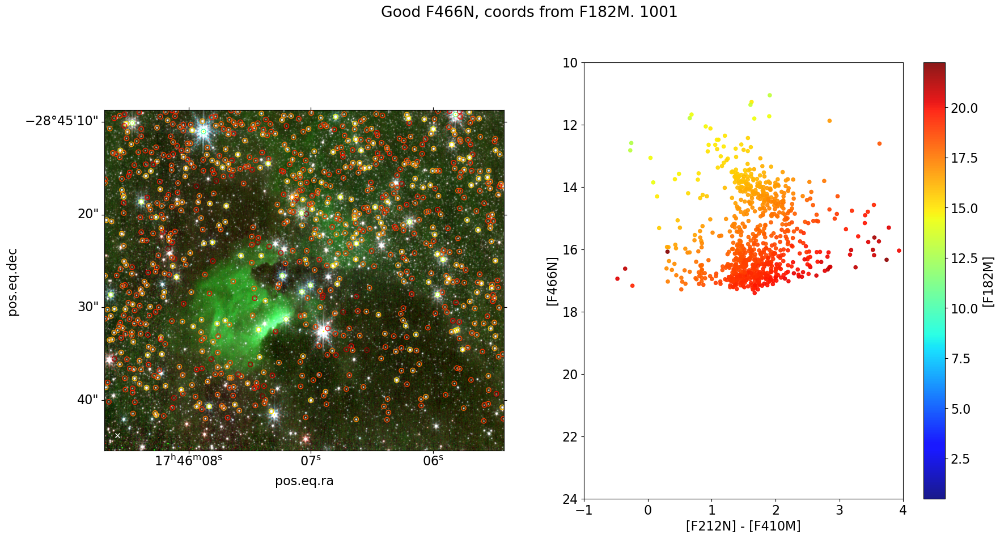

In [38]:
reg = regions.Regions.read(f'{basepath}/regions_/south_pillar.reg')[0]
mask = reg.to_pixel(wwi).to_mask()
slcs,_ = mask.get_overlap_slices(img.shape[:2])
co = img[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi[slcs])
pl.imshow(co)

crds = basetable['skycoord_f182m']
sel = reg.contains(crds, ww410)
sel &= basetable['sep_f405n'].quantity < 0.05*u.arcsec
#sel &= ~any_saturated
#sel &= short_good
#sel &= long_good
sel &= basetable['good_f466n']
sel &= basetable['nmatch_good_f466n'] > 4
#sel &= basetable['nmatch_good_f182m'] > 4
#sel &= basetable['nmatch_good_f212n'] > 4
#sel &= basetable['nmatch_good_f410m'] > 4
print(reg.contains(crds, ww410).sum(), (basetable['sep_f405n'].quantity < 0.1*u.arcsec).sum(), long_good.sum(), sel.sum())
pl.suptitle(f"Good F466N, coords from F182M. {sel.sum()}")
#sel &= long_good & (~any_saturated)
xx,yy = ww410[slcs].world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m']

colornorm = simple_norm(colorby[sel], min_cut=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
pl.plot(44,54, 'wx')
wwi[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F212N] - [F410M]");
ax2.set_ylabel("[F466N]");
ax2.axis((-1,4,24,10));

In [39]:
img_short_merged.shape

(11772, 4945, 3)

1079 395148 2804377 173


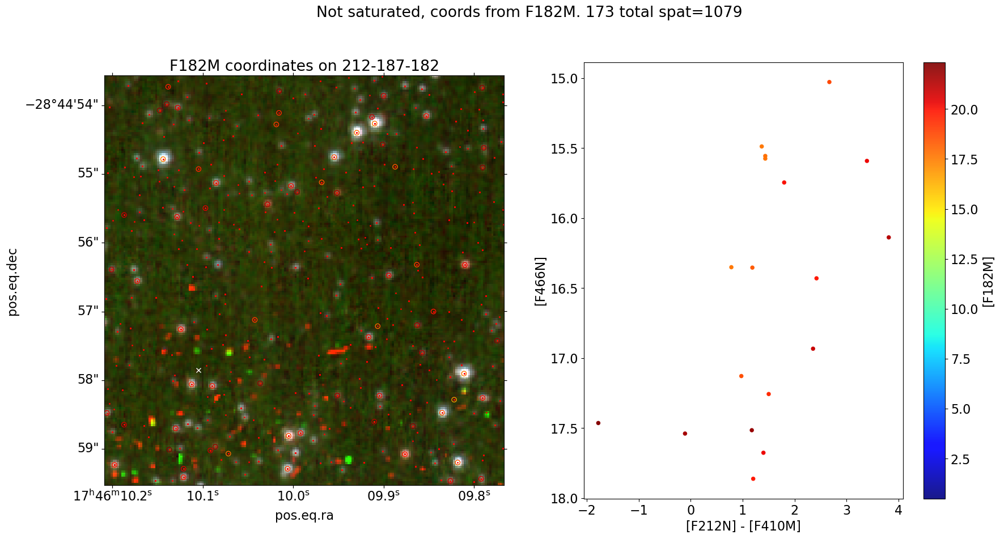

In [40]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(wwi_short_merged).to_mask()
slcs,_ = mask.get_overlap_slices(img_short_merged.shape[:2])
co = img_short_merged[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi_short_merged[slcs])
pl.imshow(co)

crds = basetable['skycoord_f182m']
sel = reg.contains(crds, wwi_short_merged)
sel_spat = reg.contains(crds, wwi_short_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated

pl.suptitle(f"Not saturated, coords from F182M. {sel.sum()} total spat={sel_spat.sum()}")

print(sel_spat.sum(),
      (basetable['sep_f405n'].quantity < 0.1*u.arcsec).sum(),
      (~any_saturated).sum(),
     sel.sum()
     )

#sel &= short_good
#sel &= long_good & (~any_saturated)
xx,yy = wwi_short_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m']

colornorm = simple_norm(colorby[sel], min_cut=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c='r',
                  s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
pl.plot(44,54, 'wx')
# debug wwi_short_merged[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel_spat],
            (basetable['mag_ab_f466n'])[sel_spat],
            s=10, alpha=0.9,
            c=colorby[sel_spat],
            norm=colornorm, cmap='jet'
           )
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F212N] - [F410M]");
ax2.set_ylabel("[F466N]");
#ax2.axis((-1,4,24,12));
ax.set_title("F182M coordinates on 212-187-182");

In [41]:
avm_long_merged = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_1182p2221_466_444_410.png')
img_long_merged = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_1182p2221_466_444_410.png'))[::-1,:,:]
wwi_long_merged = wcs.WCS(fits.Header.fromstring(avm_long_merged.Spatial.FITSheader))

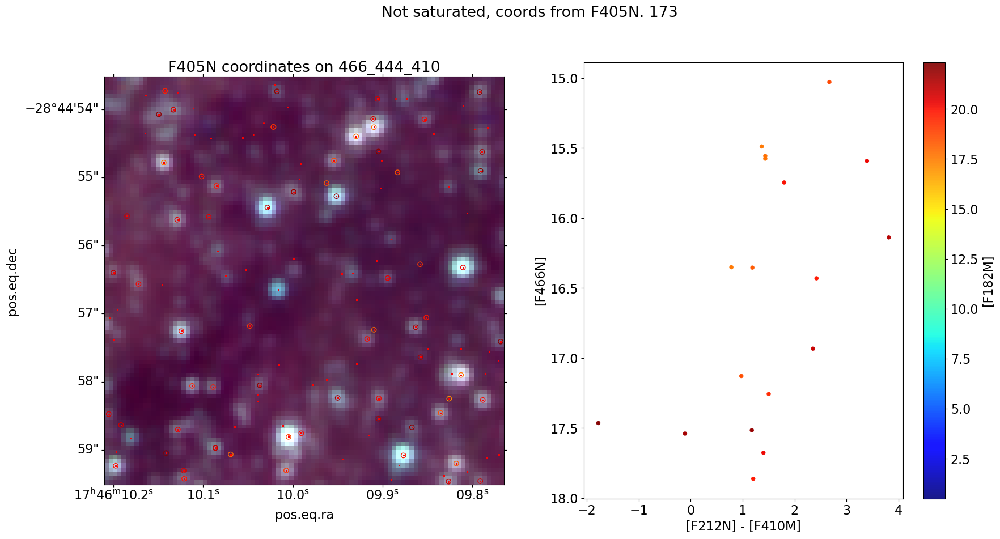

In [42]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(wwi_long_merged).to_mask()
slcs,_ = mask.get_overlap_slices(img_long_merged.shape[:2])
co = img_long_merged[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi_long_merged[slcs])
pl.imshow(co)

crds = basetable['skycoord_f405n']
sel = reg.contains(crds, wwi_long_merged)
sel_spat = reg.contains(crds, wwi_long_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated

pl.suptitle(f"Not saturated, coords from F405N. {sel.sum()}")
#sel &= long_good
#sel &= long_good & (~any_saturated)
xx,yy = wwi_long_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m']

colornorm = simple_norm(colorby[sel], min_cut=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c='r',
                  s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel_spat],
            (basetable['mag_ab_f466n'])[sel_spat],
            s=5, alpha=0.9,
            c=colorby[sel_spat],
            norm=colornorm, cmap='jet'
           )
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F212N] - [F410M]");
ax2.set_ylabel("[F466N]");
#ax2.axis((-2,7,24,14));
ax.set_title("F405N coordinates on 466_444_410");

### DEBUG check: F410M sources weren't lined up before 6/12/2024

....and they still look pretty bad

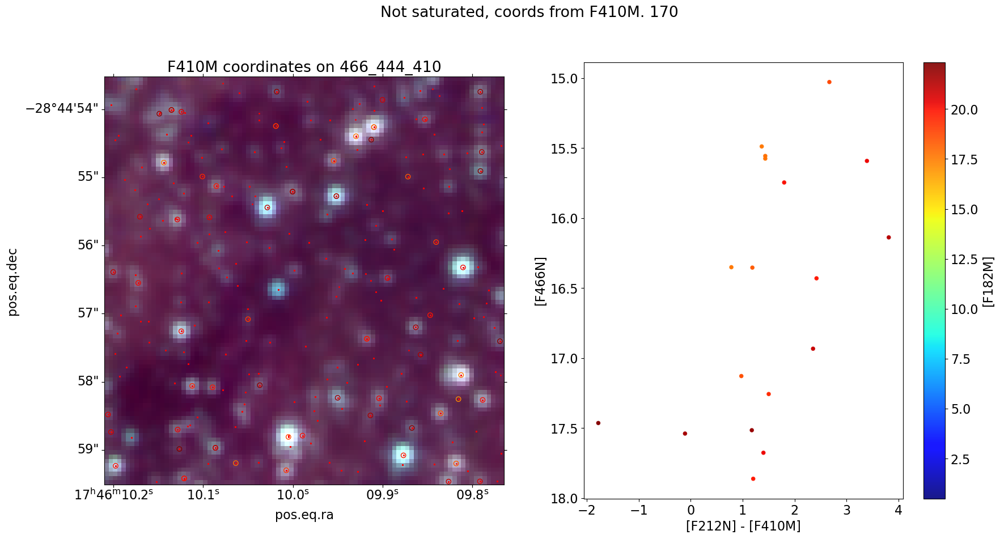

In [43]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(wwi_long_merged).to_mask()
slcs,_ = mask.get_overlap_slices(img_long_merged.shape[:2])
co = img_long_merged[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi_long_merged[slcs])
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = reg.contains(crds, wwi_long_merged)
sel_spat = reg.contains(crds, wwi_long_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated
#sel &= long_good
#sel &= long_good & (~any_saturated)
pl.suptitle(f"Not saturated, coords from F410M. {sel.sum()}")
xx,yy = wwi_long_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m']

colornorm = simple_norm(colorby[sel], vmin=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c='r',
                  s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel_spat],
            (basetable['mag_ab_f466n'])[sel_spat],
            s=5, alpha=0.9,
            c=colorby[sel_spat],
            norm=colornorm, cmap='jet'
           )
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F212N] - [F410M]");
ax2.set_ylabel("[F466N]");
#ax2.axis((-2,7,24,10));
ax.set_title("F410M coordinates on 466_444_410");

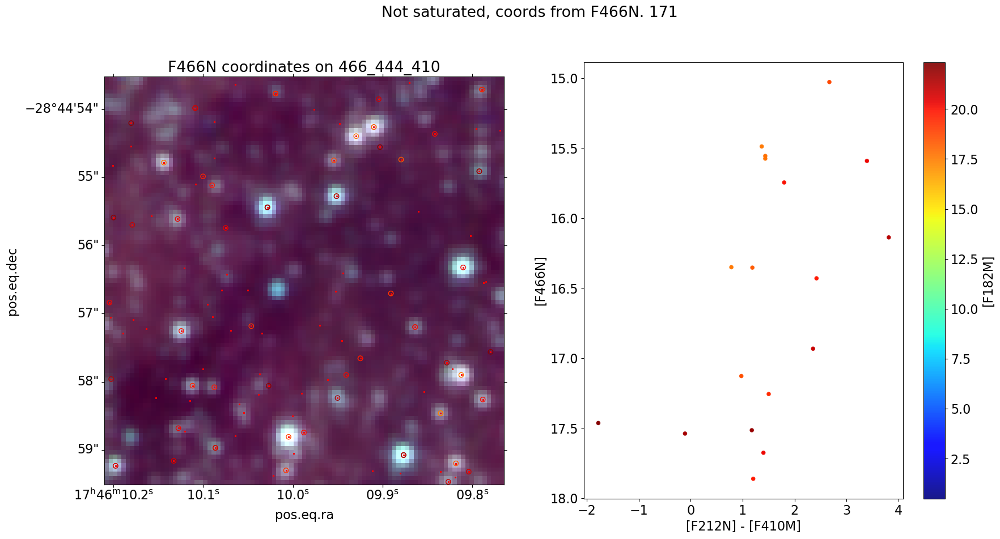

In [44]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(wwi_long_merged).to_mask()
slcs,_ = mask.get_overlap_slices(img_long_merged.shape[:2])
co = img_long_merged[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi_long_merged[slcs])
pl.imshow(co)

crds = basetable['skycoord_f466n']
sel = reg.contains(crds, wwi_long_merged)
sel_spat = reg.contains(crds, wwi_long_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated
#sel &= long_good
#sel &= long_good & (~any_saturated)
pl.suptitle(f"Not saturated, coords from F466N. {sel.sum()}")
xx,yy = wwi_long_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m']

colornorm = simple_norm(colorby[sel], vmin=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c='r',
                  s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
# debug wwi_long_merged[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel_spat],
            (basetable['mag_ab_f466n'])[sel_spat],
            s=5, alpha=0.9,
            c=colorby[sel_spat],
            norm=colornorm, cmap='jet'
           )
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F212N] - [F410M]");
ax2.set_ylabel("[F466N]");
#ax2.axis((-2,7,24,10));
ax.set_title("F466N coordinates on 466_444_410");

In [45]:
from analysis_setup import fh_merged as fh, ww410_merged as ww410, ww410_merged as ww, ww410_merged, fh_merged

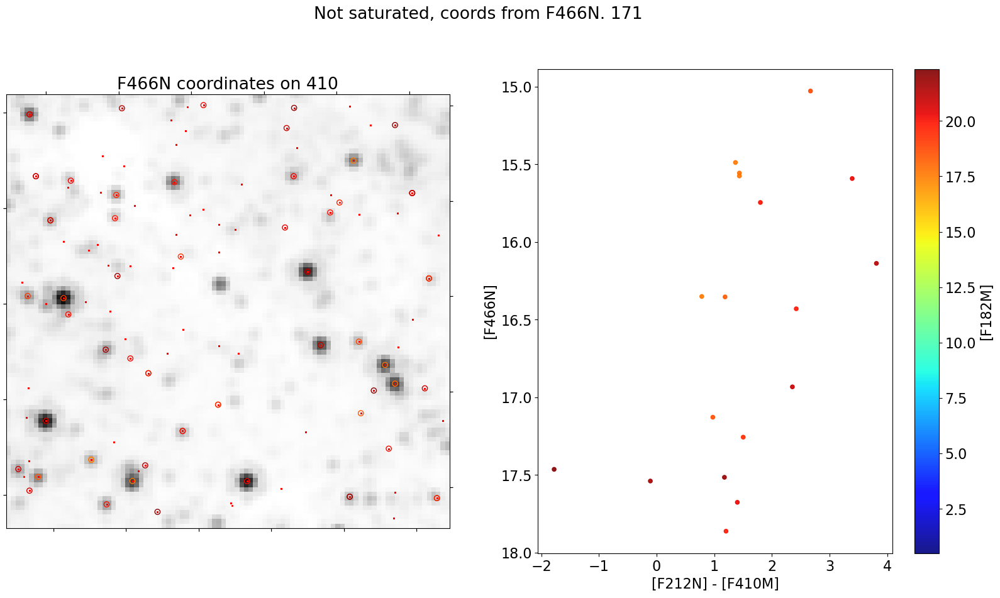

In [46]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(ww410_merged).to_mask()
slcs,_ = mask.get_overlap_slices(fh_merged['SCI'].data.shape[:2])
co = fh_merged['SCI'].data[slcs]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=ww410_merged[slcs])
pl.imshow(co, cmap='gray_r', norm=simple_norm(co, stretch='asinh', min_percent=1, max_percent=99.995), origin='lower')

crds = basetable['skycoord_f466n']
sel = reg.contains(crds, ww410_merged)
sel_spat = reg.contains(crds, ww410_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated
#sel &= long_good
#sel &= long_good & (~any_saturated)
pl.suptitle(f"Not saturated, coords from F466N. {sel.sum()}")
xx,yy = ww410_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m']

colornorm = simple_norm(colorby[sel], min_cut=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c='r',
                  s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
# debug wwi_long_merged[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F212N] - [F410M]");
ax2.set_ylabel("[F466N]");
#ax2.axis((-2,7,24,10));
ax.set_title("F466N coordinates on 410");

In [47]:
fh_405 = fits.open(f'{basepath}/F405N/pipeline/jw02221-o001_t001_nircam_clear-f405n-merged_i2d.fits')
ww405_merged = WCS(fh_405['SCI'].header)

Set DATE-AVG to '2022-08-28T00:59:05.370' from MJD-AVG.
Set DATE-END to '2022-08-28T01:27:10.957' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.725189 from OBSGEO-[XYZ].
Set OBSGEO-H to 1527161940.784 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


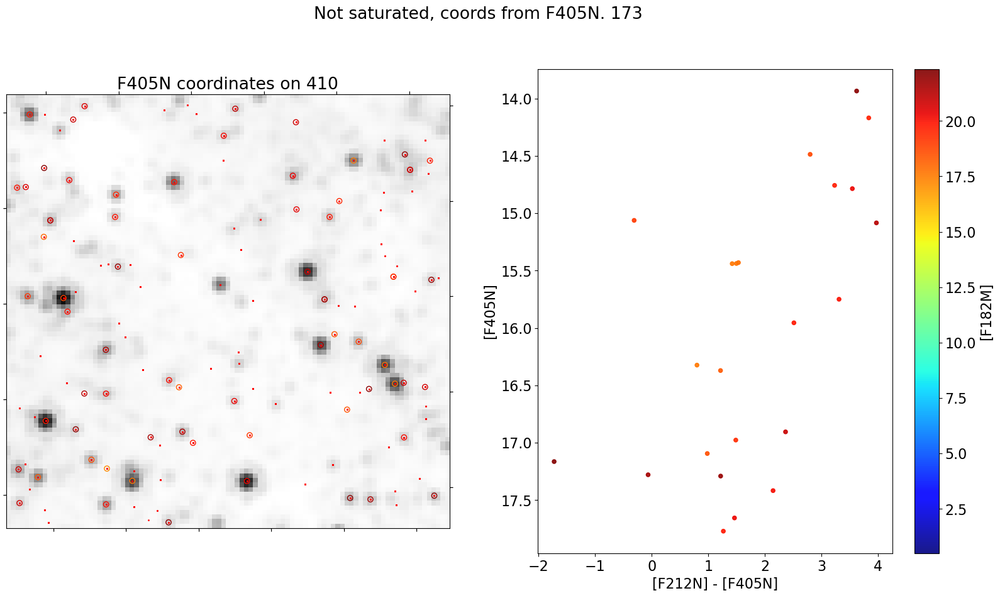

In [48]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(ww410_merged).to_mask()
slcs,_ = mask.get_overlap_slices(fh_merged['SCI'].data.shape[:2])
co = fh_merged['SCI'].data[slcs]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=ww410_merged[slcs])
pl.imshow(co, cmap='gray_r', norm=simple_norm(co, stretch='asinh', min_percent=1, max_percent=99.995), origin='lower')

crds = basetable['skycoord_f405n']
sel = reg.contains(crds, ww410_merged)
sel_spat = reg.contains(crds, ww410_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated
#sel &= long_good
#sel &= long_good & (~any_saturated)
pl.suptitle(f"Not saturated, coords from F405N. {sel.sum()}")
xx,yy = ww410_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m']

colornorm = simple_norm(colorby[sel], min_cut=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c='r',
                  s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
# debug wwi_long_merged[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f405m'] - basetable['mag_ab_f405n'], basetable['mag_ab_f405m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
            (basetable['mag_ab_f405n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F212N] - [F405N]");
ax2.set_ylabel("[F405N]");
#ax2.axis((-2,7,24,10));
ax.set_title("F405N coordinates on 410");

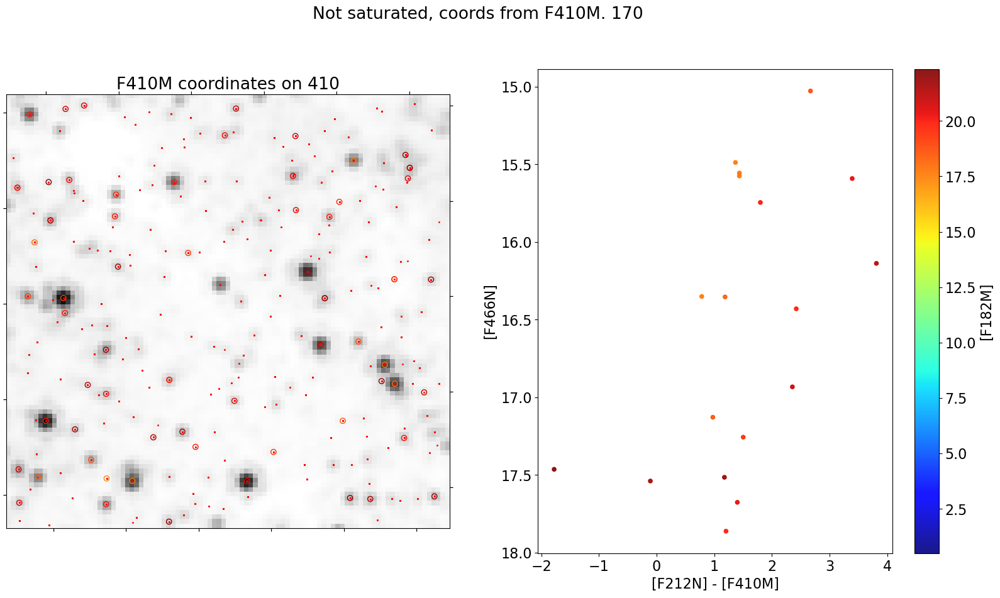

In [49]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(ww410_merged).to_mask()
slcs,_ = mask.get_overlap_slices(fh_merged['SCI'].data.shape[:2])
co = fh_merged['SCI'].data[slcs]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=ww410_merged[slcs])
pl.imshow(co, cmap='gray_r', norm=simple_norm(co, stretch='asinh', min_percent=1, max_percent=99.995), origin='lower')

crds = basetable['skycoord_f410m']
sel = reg.contains(crds, ww410_merged)
sel_spat = reg.contains(crds, ww410_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated
#sel &= long_good
#sel &= long_good & (~any_saturated)
pl.suptitle(f"Not saturated, coords from F410M. {sel.sum()}")
xx,yy = ww410_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m']

colornorm = simple_norm(colorby[sel], min_cut=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c='r',
                  s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
# debug wwi_long_merged[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F212N] - [F410M]");
ax2.set_ylabel("[F466N]");
#ax2.axis((-2,7,24,10));
ax.set_title("F410M coordinates on 410");

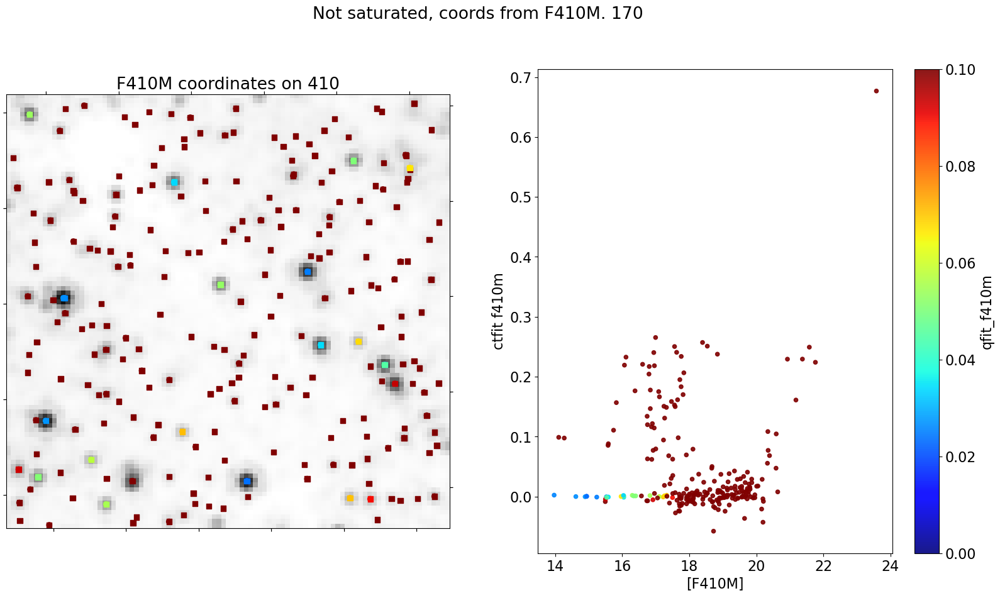

In [50]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(ww410_merged).to_mask()
slcs,_ = mask.get_overlap_slices(fh_merged['SCI'].data.shape[:2])
co = fh_merged['SCI'].data[slcs]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=ww410_merged[slcs])
pl.imshow(co, cmap='gray_r', norm=simple_norm(co, stretch='asinh', min_percent=1, max_percent=99.995), origin='lower')

crds = basetable['skycoord_f410m']
sel = reg.contains(crds, ww410_merged)
sel_spat = reg.contains(crds, ww410_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated
#sel &= long_good
#sel &= long_good & (~any_saturated)
pl.suptitle(f"Not saturated, coords from F410M. {sel.sum()}")
xx,yy = ww410_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['qfit_f410m']

colornorm = simple_norm(colorby[sel], vmin=0, vmax=0.1)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel_spat],
                   cmap='jet',
                   marker='s',
                   norm=colornorm
                  #s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
# debug wwi_long_merged[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f410m'])[sel_spat],
            (basetable['cfit_f410m'])[sel_spat],
            s=20, alpha=0.9,
            c=colorby[sel_spat],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("qfit_f410m")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F410M]");
ax2.set_ylabel("ctfit f410m");
#ax2.axis((-2,7,24,10));
ax.set_title("F410M coordinates on 410");

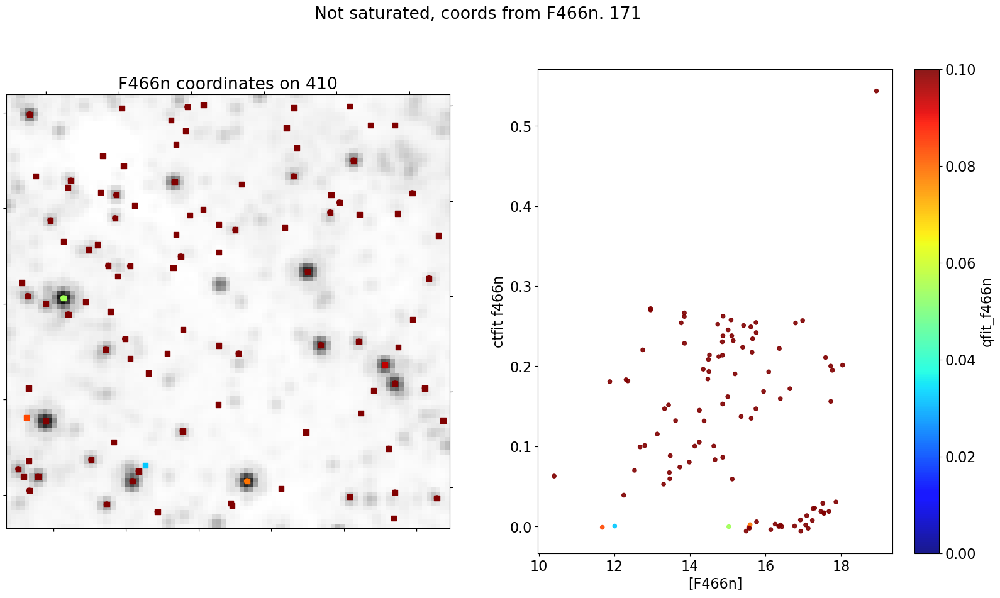

In [51]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(ww410_merged).to_mask()
slcs,_ = mask.get_overlap_slices(fh_merged['SCI'].data.shape[:2])
co = fh_merged['SCI'].data[slcs]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=ww410_merged[slcs])
pl.imshow(co, cmap='gray_r', norm=simple_norm(co, stretch='asinh', min_percent=1, max_percent=99.995), origin='lower')

crds = basetable['skycoord_f466n']
sel = reg.contains(crds, ww410_merged)
sel_spat = reg.contains(crds, ww410_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated
#sel &= long_good
#sel &= long_good & (~any_saturated)
pl.suptitle(f"Not saturated, coords from F466n. {sel.sum()}")
xx,yy = ww410_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['qfit_f466n']

colornorm = simple_norm(colorby[sel], vmin=0, vmax=0.1)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel_spat],
                   cmap='jet',
                   marker='s',
                   norm=colornorm
                  #s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
# debug wwi_long_merged[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f466n'] - basetable['mag_ab_f466n'], basetable['mag_ab_f466n'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f466n'])[sel_spat],
            (basetable['cfit_f466n'])[sel_spat],
            s=20, alpha=0.9,
            c=colorby[sel_spat],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("qfit_f466n")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F466n]");
ax2.set_ylabel("ctfit f466n");
#ax2.axis((-2,7,24,10));
ax.set_title("F466n coordinates on 410");

Set DATE-AVG to '2022-08-28T02:01:42.906' from MJD-AVG.
Set DATE-END to '2022-08-28T02:29:48.969' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.693175 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526785127.355 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


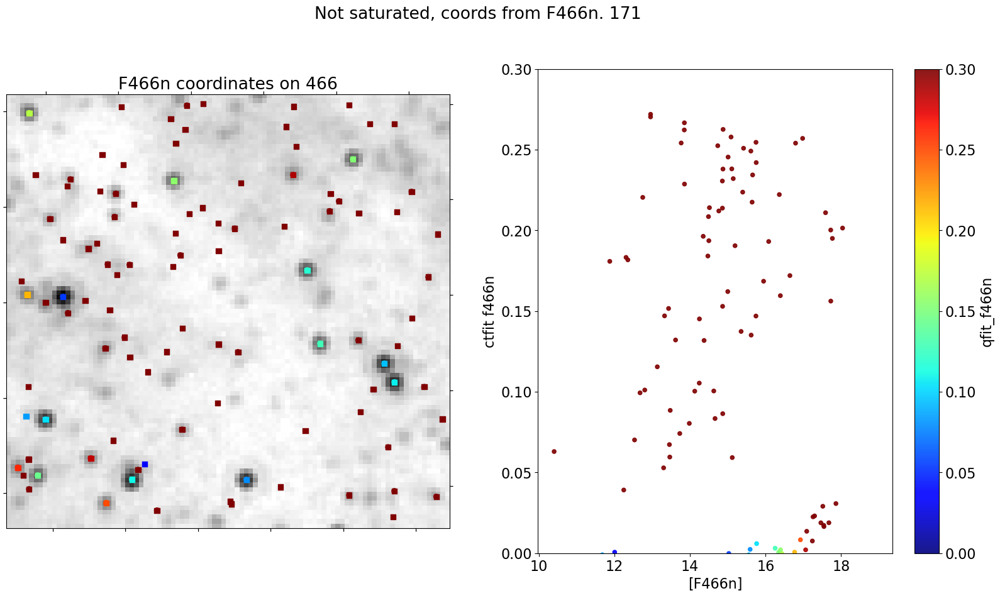

In [52]:
fh_466 = fits.open(f'{basepath}/F466N/pipeline/jw02221-o001_t001_nircam_clear-f466n-merged_i2d.fits')
ww466_merged = wcs.WCS(fh_466[1].header)

reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(ww466_merged).to_mask()
slcs,_ = mask.get_overlap_slices(fh_merged['SCI'].data.shape[:2])
co = fh_466['SCI'].data[slcs]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=ww466_merged[slcs])
pl.imshow(co, cmap='gray_r', norm=simple_norm(co, stretch='asinh', min_percent=1, max_percent=99.995), origin='lower')

crds = basetable['skycoord_f466n']
sel = reg.contains(crds, ww466_merged)
sel_spat = reg.contains(crds, ww466_merged)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= ~any_saturated
#sel &= long_good
#sel &= long_good & (~any_saturated)
pl.suptitle(f"Not saturated, coords from F466n. {sel.sum()}")
xx,yy = ww466_merged[slcs].world_to_pixel(crds[sel])

colorby = basetable['qfit_f466n']

colornorm = simple_norm(colorby[sel], vmin=0, vmax=0.3)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel_spat],
                   cmap='jet',
                   marker='s',
                   norm=colornorm
                  #s=1,
                 )
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
# debug wwi_long_merged[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f466n'] - basetable['mag_ab_f466n'], basetable['mag_ab_f466n'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f466n'])[sel_spat],
            (basetable['cfit_f466n'])[sel_spat],
            s=20, alpha=0.9,
            c=colorby[sel_spat],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("qfit_f466n")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F466n]");
ax2.set_ylabel("ctfit f466n");
ax2.set_ylim(0, 0.3)
#ax2.axis((-2,7,24,10));
ax.set_title("F466n coordinates on 466");

Set DATE-AVG to '2022-08-28T02:01:42.906' from MJD-AVG.
Set DATE-END to '2022-08-28T02:29:48.969' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.693175 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526785127.355 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


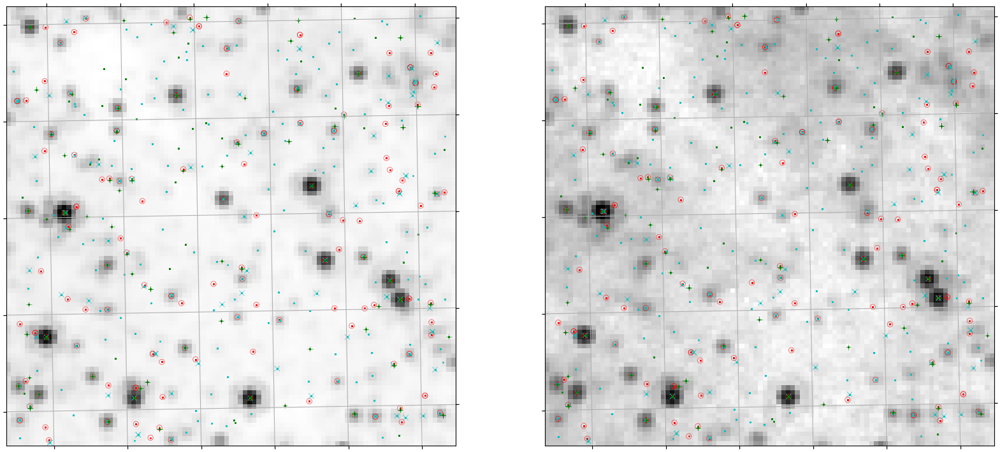

In [53]:
reg = regions.Regions.read(f'{basepath}/regions_/leftside_brick_rezoom.reg')[0]
mask = reg.to_pixel(ww410_merged).to_mask()
slcs,_ = mask.get_overlap_slices(fh_merged['SCI'].data.shape[:2])
co = fh_merged['SCI'].data[slcs]

pl.figure(figsize=(20,10))
ax1 = pl.subplot(1,2,1, projection=ww410_merged[slcs])
pl.imshow(co, cmap='gray_r', norm=simple_norm(co, stretch='asinh', min_percent=0.1, max_percent=99.95), origin='lower')

fh_466 = fits.open(f'{basepath}/F466N/pipeline/jw02221-o001_t001_nircam_clear-f466n-merged_i2d.fits')
ww466_merged = wcs.WCS(fh_466[1].header)

mask = reg.to_pixel(ww466_merged).to_mask()
slcs,_ = mask.get_overlap_slices(fh_466['SCI'].data.shape[:2])
co = fh_466['SCI'].data[slcs[0], slcs[1]]
ax2 = pl.subplot(1,2,2, projection=ww466_merged[slcs])
pl.imshow(co, cmap='gray_r', norm=simple_norm(co, stretch='asinh', min_percent=0.1, max_percent=99.95), origin='lower')


for filtername, color, marker in zip(('f405n', 'f410m', 'f466n'), 'rcg', 'ox+'):
    crds = basetable[f'skycoord_{filtername}']
    sel = reg.contains(crds, ww410_merged)
    sel_spat = reg.contains(crds, ww410_merged)
    sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
    #sel &= ~any_saturated

    for ax in (ax1, ax2):
        scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                          #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                          c=color, marker=marker, alpha=0.75, linewidth=0.5)
        scat2 = ax.scatter(crds.ra[sel_spat], crds.dec[sel_spat], transform=ax.get_transform('world'),
                          #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                          c=color,
                          s=1,
                         )
        pl.draw()
        colors = scat.get_facecolors()
        scat.set_edgecolors(colors)
        scat.set_facecolors('none')
ax1.grid()
ax2.grid()

# Glue experiments (these change the underlying table)

In [54]:
basetable.colnames

['skycoord_ref',
 'skycoord_ref_filtername',
 'sep_f410m',
 'id_f410m',
 'skycoord_f410m',
 'flux_f410m',
 'flux_err_f410m',
 'mask_f410m',
 'qfit_f410m',
 'cfit_f410m',
 'flux_init_f410m',
 'flags_f410m',
 'local_bkg_f410m',
 'group_size_f410m',
 'dra_f410m',
 'ddec_f410m',
 'std_ra_f410m',
 'std_dec_f410m',
 'nmatch_f410m',
 'nmatch_good_f410m',
 'flux_err_prop_f410m',
 'flux_jy_f410m',
 'mag_ab_f410m',
 'eflux_jy_f410m',
 'emag_ab_f410m',
 'near_saturated_f410m_f410m',
 'replaced_saturated_f410m',
 'sep_f212n',
 'id_f212n',
 'skycoord_f212n',
 'flux_f212n',
 'flux_err_f212n',
 'mask_f212n',
 'qfit_f212n',
 'cfit_f212n',
 'flux_init_f212n',
 'flags_f212n',
 'local_bkg_f212n',
 'group_size_f212n',
 'dra_f212n',
 'ddec_f212n',
 'std_ra_f212n',
 'std_dec_f212n',
 'nmatch_f212n',
 'nmatch_good_f212n',
 'flux_err_prop_f212n',
 'flux_jy_f212n',
 'mag_ab_f212n',
 'eflux_jy_f212n',
 'emag_ab_f212n',
 'near_saturated_f212n_f212n',
 'replaced_saturated_f212n',
 'sep_f466n',
 'id_f466n',
 'skyc

## Plots copied from other places

In [55]:
from plot_tools import plot_extvec_ccd

Selected 113685 stars for the colorcolor diagram plot


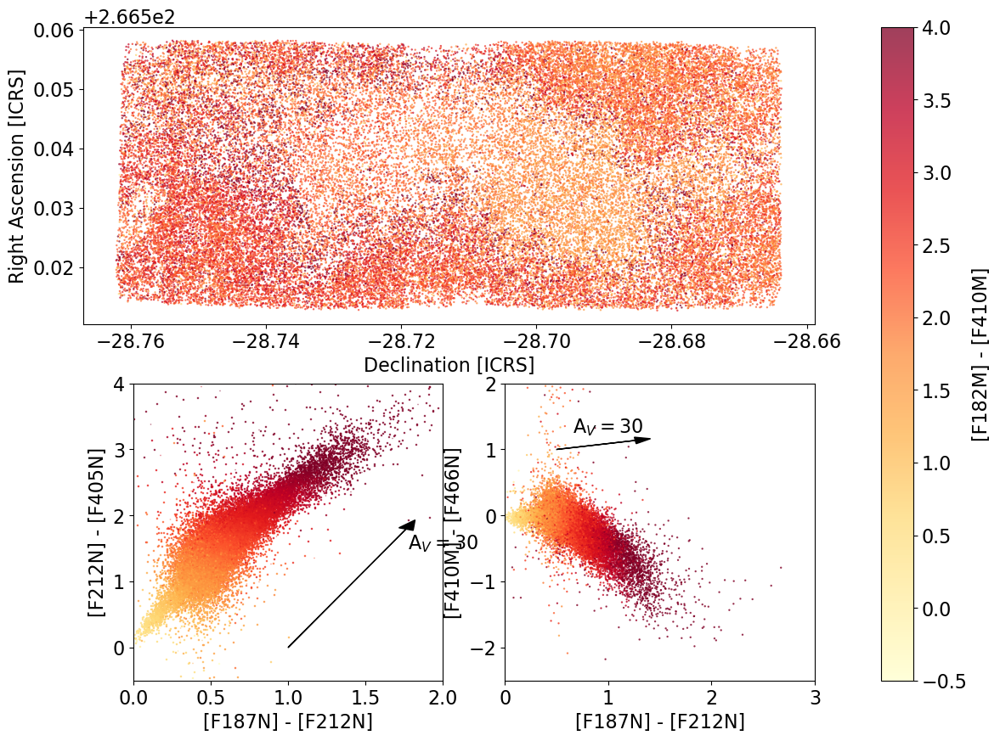

In [56]:
pl.figure(figsize=(20,10))
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.05*u.arcsec
sel &= basetable['sep_f212n'].quantity < 0.05*u.arcsec
#sel &= (~any_saturated) & (any_good)
sel &= basetable['nmatch_good_f410m'] > 2
sel &= basetable['nmatch_good_f212n'] > 2
#sel &= basetable['mag_ab_f410m'] < 18.5
xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1, 0,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, 1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars for the colorcolor diagram plot")

Selected 37347 stars for the colorcolor diagram plot


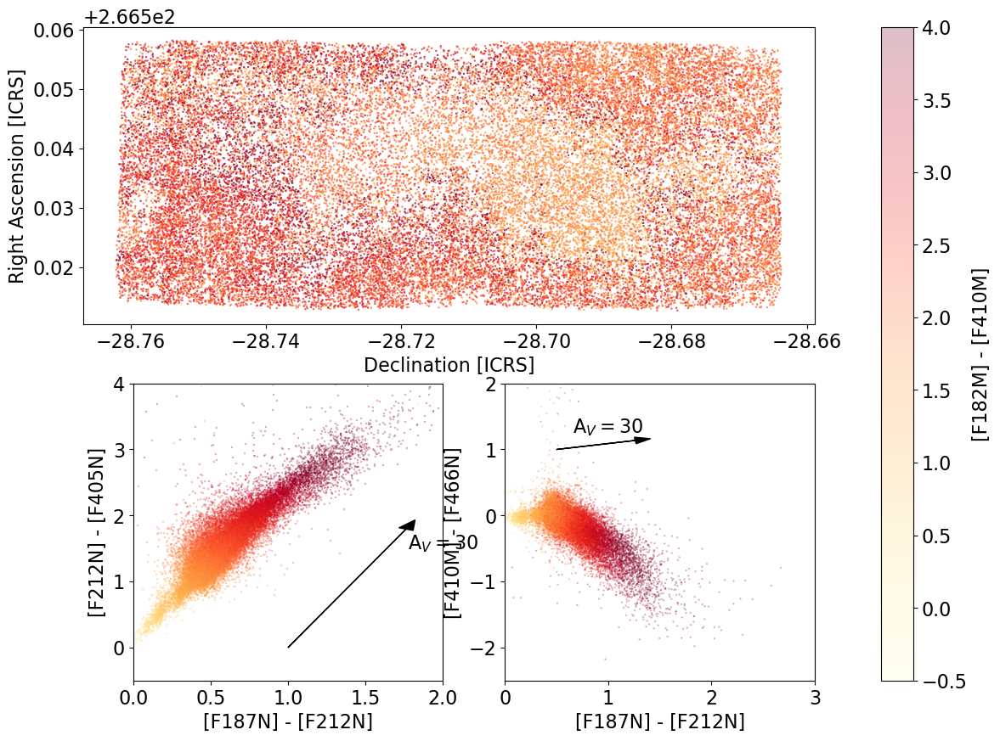

In [57]:
pl.figure(figsize=(20,10))
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.05*u.arcsec
sel &= basetable['sep_f212n'].quantity < 0.05*u.arcsec
#sel &= (~any_saturated) & (any_good)
sel &= basetable['nmatch_good_f410m'] > 2
sel &= basetable['nmatch_good_f212n'] > 2
# add qfit cuts - can be generous by requiring multiple bands
sel &= basetable['qfit_f410m'] < 0.5
sel &= basetable['qfit_f405n'] < 0.5
sel &= basetable['qfit_f212n'] < 0.5
#sel &= basetable['mag_ab_f410m'] < 18.5
xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.25,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1, 0,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, 1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.25,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars for the colorcolor diagram plot")

Selected 17779 stars for the colorcolor diagram plot


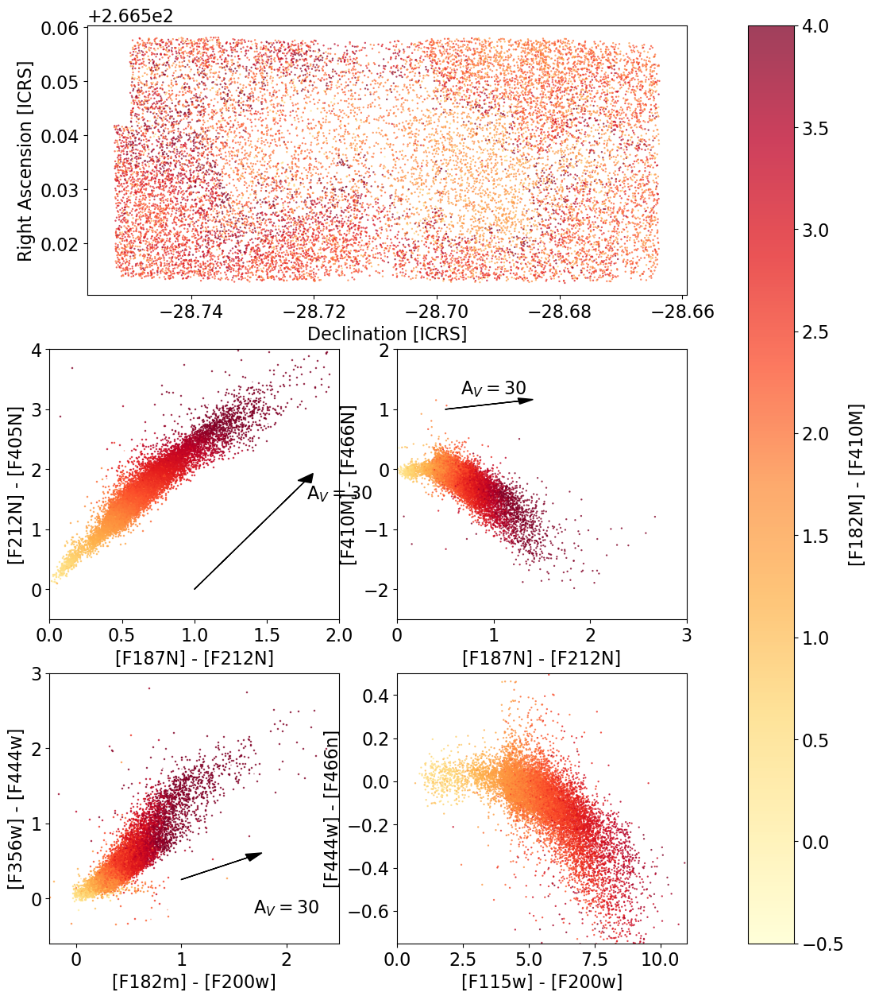

In [58]:
pl.figure(figsize=(20,15))
ax = pl.subplot(3,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.05*u.arcsec
sel &= basetable['sep_f212n'].quantity < 0.05*u.arcsec
#sel &= (~any_saturated) & (any_good)
sel &= basetable['nmatch_good_f410m'] > 2
sel &= basetable['nmatch_good_f212n'] > 2
sel &= basetable['emag_ab_f410m'] < 0.1
#sel &= basetable['emag_ab_f212n'] < 0.1
#sel &= basetable['emag_ab_f200w'] < 0.1
sel &= basetable['emag_ab_f444w'] < 0.1
sel &= basetable['emag_ab_f466n'] < 0.1
#sel &= basetable['mag_ab_f410m'] < 18.5
xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=4)
cmap = 'YlOrRd'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(3,3,5)
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f187n', 'f212n'), ('f212n', 'f405n'), start=(1, 0,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F187N] - [F212N]")
ax2.set_ylabel("[F212N] - [F405N]");
ax2.axis((0.0, 2, -0.5, 4));
ax2.text(2, 1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(3,3,6)
sc = ax3.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax3, ('f187n', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F187N] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

print(f"Selected {sel.sum()} stars for the colorcolor diagram plot")



ax2 = pl.subplot(3,3,8)
sc = ax2.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f200w'])[sel],
                 (basetable['mag_ab_f356w'] - basetable['mag_ab_f444w'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f182m', 'f200w'), ('f356w', 'f444w'), start=(1, 0.25,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F182m] - [F200w]")
ax2.set_ylabel("[F356w] - [F444w]");
ax2.axis((-0.25, 2.5, -0.6, 3));
ax2.text(2, -0.2, "A$_V = 30$", ha='center')


ax3 = pl.subplot(3,3,9)
sc = ax3.scatter((basetable['mag_ab_f115w'] - basetable['mag_ab_f200w'])[sel],
            (basetable['mag_ab_f444w'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
#plot_extvec_ccd(ax3, ('f115w', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)

ax3.set_xlabel("[F115w] - [F200w]")
ax3.set_ylabel("[F444w] - [F466n]")
ax3.axis((0,11,-0.75,0.5));
#ax3.text(8, 0.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F182M] - [F410M]")

### There are only a couple candidates for CO emitters

and they seem mostly to be faint and/or non-accreters

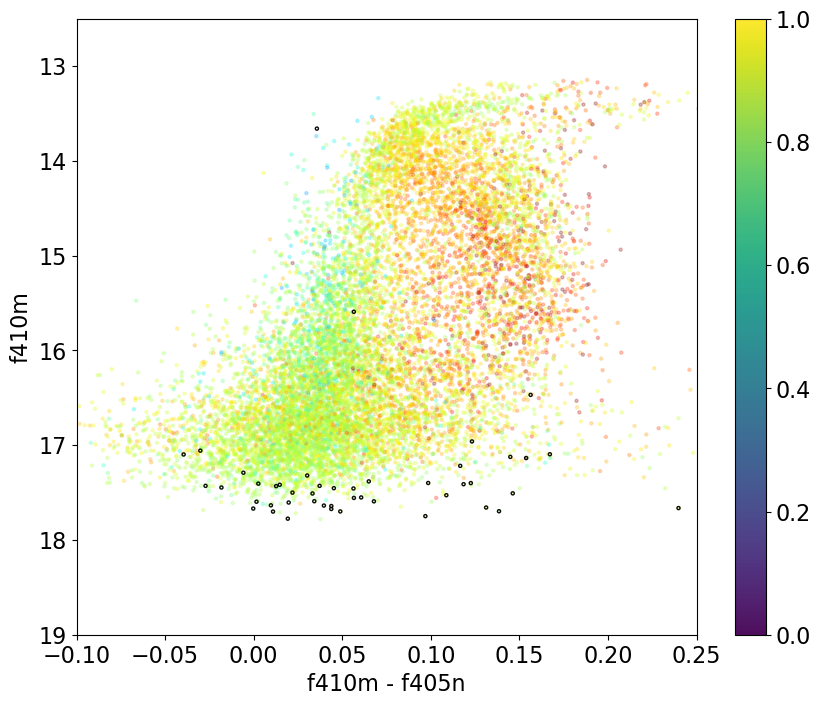

In [65]:
basesel = (basetable['nmatch_good_f405n'] >= 5) & (basetable['nmatch_good_f410m'] >= 5)
basesel &= (basetable['emag_ab_f410m'] < 0.1) & (basetable['emag_ab_f405n'] < 0.1)
basesel &= basetable['nmatch_good_f410m'] > 2
basesel &= basetable['nmatch_good_f212n'] > 2
basesel &= basetable['emag_ab_f410m'] < 0.1
basesel &= basetable['emag_ab_f444w'] < 0.1
basesel &= basetable['emag_ab_f466n'] < 0.1

sel = (basetable['mag_ab_f444w'] - basetable['mag_ab_f466n']) > 0.25
sel &= basesel

pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[basesel], basetable['mag_ab_f410m'][basesel],
           s=5, alpha=0.25, c=(basetable['mag_ab_f200w'] - basetable['mag_ab_f356w'])[basesel],
           vmin=-1, vmax=3, cmap='jet'
          )
pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[sel], basetable['mag_ab_f410m'][sel],
           s=5, alpha=0.95, edgecolor='k', facecolor='none'
          )
#pl.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f405n'])[sel],
#           basetable['mag_ab_f410m'][sel], s=5, alpha=0.5, c='r')
pl.ylim(pl.ylim()[::-1])
pl.xlabel("f410m - f405n")
pl.ylabel("f410m")
pl.ylim(19,12.5)
pl.xlim(-0.1,0.25);
pl.colorbar();

##  in brick vs out of brick

/orange/adamginsburg/miniconda3/envs/python312/lib/python3.12/site-packages/numpy/lib/function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedColumn.
  arr.partition(


output array is read-only
output array is read-only


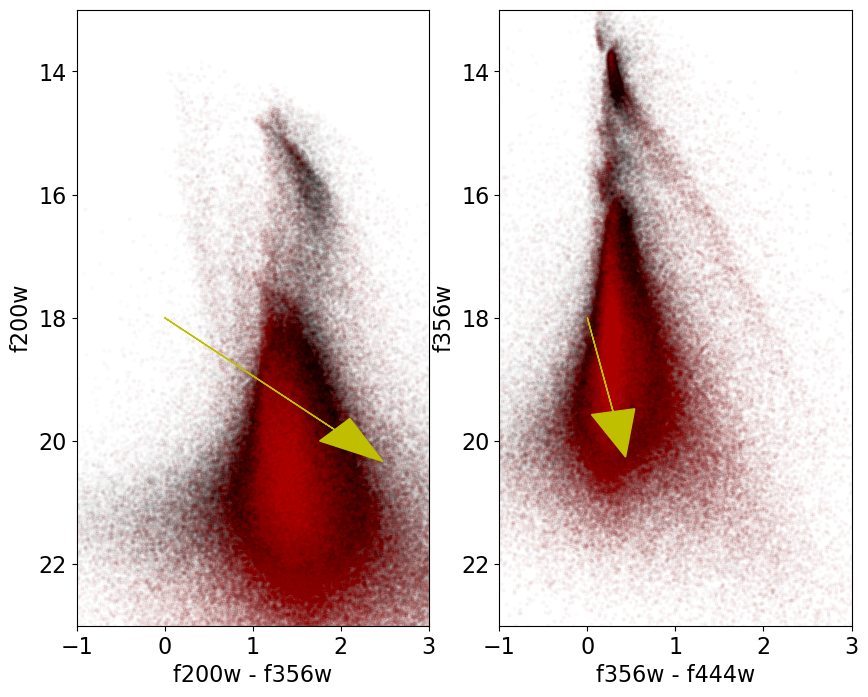

<Figure size 1000x800 with 0 Axes>

In [73]:
wholebrickreg = regions.Regions.read(f'{basepath}/regions_/brickoutline.reg')[0]
sel = wholebrickreg.contains(basetable['skycoord_ref'], ww)
plot_tools.cmds(basetable, colors=[('f200w', 'f356w'), ('f356w', 'f444w')],
                sel=sel, axlims=[-1,3,23,13], xlim_percentiles=(5,95), alpha=0.01,
                alpha_sel=0.01,
                exclude=exclude);

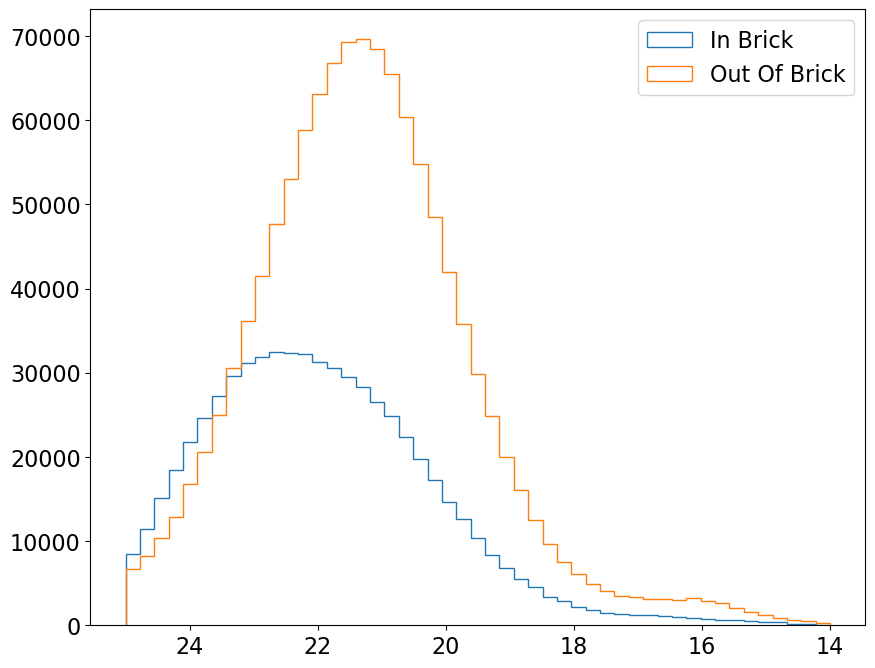

In [78]:
sel = wholebrickreg.contains(basetable['skycoord_ref'], ww)
pl.hist(basetable['mag_ab_f200w'][sel], bins=np.linspace(14, 25), histtype='step', label='In Brick')
pl.hist(basetable['mag_ab_f200w'][~sel], bins=np.linspace(14, 25), histtype='step', label='Out Of Brick')
pl.xlim(pl.xlim()[::-1]);
pl.legend(loc='best');

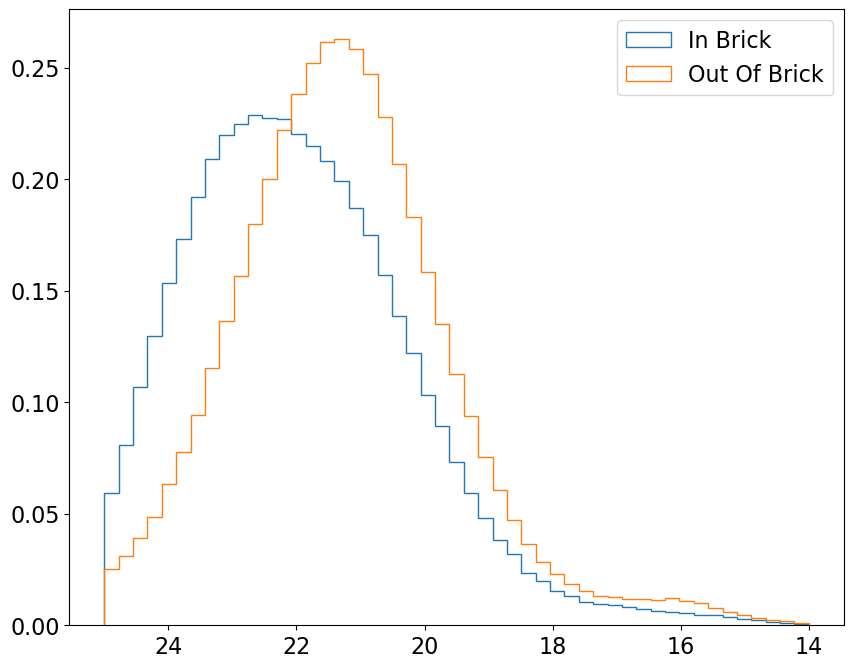

In [85]:
sel = wholebrickreg.contains(basetable['skycoord_ref'], ww)
pl.hist(basetable['mag_ab_f200w'][sel], bins=np.linspace(14, 25), histtype='step', label='In Brick', density=True)
pl.hist(basetable['mag_ab_f200w'][~sel], bins=np.linspace(14, 25), histtype='step', label='Out Of Brick', density=True)
pl.xlim(pl.xlim()[::-1]);
pl.legend(loc='best');

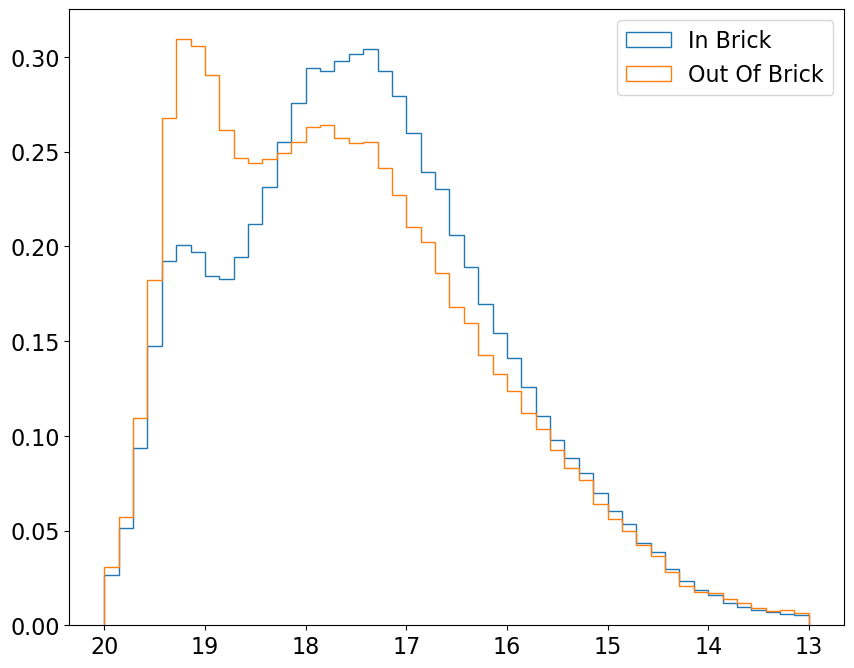

In [87]:
sel = wholebrickreg.contains(basetable['skycoord_ref'], ww)
pl.hist(basetable['mag_ab_f212n'][sel], bins=np.linspace(13, 20), histtype='step', label='In Brick', density=True)
pl.hist(basetable['mag_ab_f212n'][~sel], bins=np.linspace(13, 20), histtype='step', label='Out Of Brick', density=True)
pl.xlim(pl.xlim()[::-1]);
pl.legend(loc='best');

In [79]:
from astroquery.besancon import Besancon

In [83]:
besmod = Besancon.query(0.256, -0.013, area=0.1*u.deg**2, email='adam.g.ginsburg@gmail.com')

TypeError: 'Quantity' object with a scalar value is not iterable